## Introduction


In this notebook, I modified the processes of Gao (2018) paper where they used GMM and Random Forest (RF) to get the membership for M67 open cluster. The specific changes and their justifications are explained in Section 4.5 and 5.3 for GMM and RF, respectively.

## Reference

* Gao, X. (2018). A Machine-learning-based Investigation of the Open Cluster M67. *The Astrophysical Journal*, 869(1). https://doi.org/10.3847/1538-4357/aae8dd

## Replication

### Importing packages

In [109]:
#!pip install sklearn --upgrade

In [5]:
# uncomment for colab or for first time installment
#!pip install astroquery

In [4]:
# uncomment for colab or for first time installment
#!pip install shap

import shap

In [5]:
# import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.ensemble import RandomForestClassifier

In [6]:
# import astroquery
import astropy.units as u
import astropy.coordinates as coord
from astroquery.gaia import Gaia
from astroquery.gaia import TapPlus, GaiaClass   
from astroquery.vizier import Vizier


Created TAP+ (v1.2.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
Created TAP+ (v1.2.1) - Connection:
	Host: geadata.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443


### Finding GAIA Data

In [8]:
## making a GAIA cone_search of 1 degree radius around M67 center
## We are using DR2 as the Gao (2018) paper used DR2

coordinate = coord.SkyCoord.from_name('M67')
print(coordinate)
radius = u.Quantity(1, u.deg)
Gaia.ROW_LIMIT = -1
# table = "gaiaedr3.gaia_source"
table = "gaiadr2.gaia_source"
j = Gaia.cone_search_async(coordinate, radius)
r = j.get_results()
print(type(r))

<SkyCoord (ICRS): (ra, dec) in deg
    (132.846, 11.814)>


INFO: Query finished. [astroquery.utils.tap.core]
<class 'astropy.table.table.Table'>


In [9]:
## save the ASCII table as a panadas dataframe
all_stars = r.to_pandas()
all_stars


converted column 'priam_flags' from integer to float
converted column 'flame_flags' from integer to float


,solution_id,designation,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,dist
0,1635721458409799680,b'Gaia DR2 604917629355038848',604917629355038848,309606362,2015.5,132.845427,0.033842,11.813721,0.022365,1.129222,...,NaN,200111.0,1.939404,1.750837,2.115395,5.409647,5.116649,5.702646,b'https://gea.esac.esa.int/data-server/datalin...,0.000629
1,1635721458409799680,b'Gaia DR2 604917698073552640',604917698073552640,524821416,2015.5,132.842932,0.678479,11.812019,0.385532,1.326860,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.003599
2,1635721458409799680,b'Gaia DR2 604917732434252032',604917732434252032,1037136882,2015.5,132.847883,0.047155,11.818284,0.028357,1.113444,...,NaN,200111.0,0.748697,0.708507,0.770030,0.286409,0.253650,0.319167,b'https://gea.esac.esa.int/data-server/datalin...,0.004667
3,1635721458409799680,b'Gaia DR2 604917732434325248',604917732434325248,1685360922,2015.5,132.845628,0.023422,11.820310,0.014362,1.125087,...,0.2746,200111.0,1.255830,1.202780,1.456640,3.119858,2.927116,3.312600,b'https://gea.esac.esa.int/data-server/datalin...,0.006326
4,1635721458409799680,b'Gaia DR2 604917629355039360',604917629355039360,340729517,2015.5,132.846939,0.039546,11.807362,0.023041,1.111626,...,0.6540,200111.0,1.734736,1.658521,1.798127,1.604247,1.452243,1.756252,b'https://gea.esac.esa.int/data-server/datalin...,0.006695
5,1635721458409799680,b'Gaia DR2 604917698074587136',604917698074587136,1308383390,2015.5,132.840032,0.034797,11.817361,0.020084,1.189351,...,0.1243,200111.0,0.874312,0.819175,0.920168,0.544629,0.501133,0.588124,b'https://gea.esac.esa.int/data-server/datalin...,0.006747
6,1635721458409799680,b'Gaia DR2 604917629355040896',604917629355040896,257033838,2015.5,132.842201,0.042905,11.807752,0.026432,1.083861,...,0.2683,200111.0,0.949153,0.809521,1.005471,0.470240,0.419616,0.520864,b'https://gea.esac.esa.int/data-server/datalin...,0.007269
7,1635721458409799680,b'Gaia DR2 604917732433399424',604917732433399424,625093573,2015.5,132.841826,0.964178,11.820685,0.486300,1.180611,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,b'https://gea.esac.esa.int/data-server/datalin...,0.007843
8,1635721458409799680,b'Gaia DR2 604917625061651328',604917625061651328,938602003,2015.5,132.850543,0.066481,11.807408,0.040288,1.174123,...,0.3153,200111.0,0.589553,0.512689,0.703596,0.146748,0.125122,0.168375,b'https://gea.esac.esa.int/data-server/datalin...,0.007944
9,1635721458409799680,b'Gaia DR2 604917663714774784',604917663714774784,1435314298,2015.5,132.853914,0.021701,11.816875,0.014180,1.159197,...,NaN,200111.0,1.700072,1.336529,2.030512,3.138730,2.947859,3.329600,b'https://gea.esac.esa.int/data-server/datalin...,0.008259


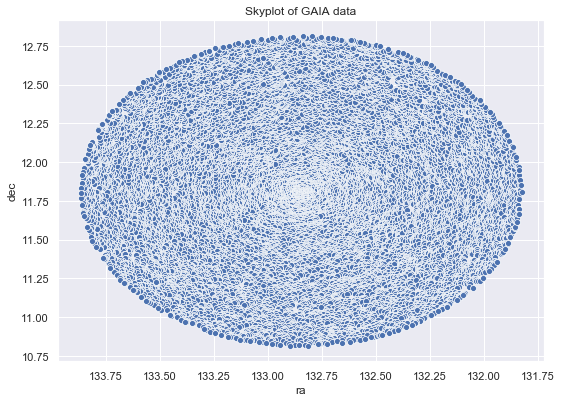

In [10]:
## plotting the skyplot 

sns.set(rc={'figure.figsize':(8.7,6.27)})

skyplot = sns.scatterplot(x='ra', y='dec', data = all_stars)
skyplot.invert_xaxis()
plt.title('Skyplot of GAIA data')
plt.show()

### Applying Filter:

#### Remove Noisy Data

In [11]:
## magnitude error
all_stars['g_mag_error'] = 2.5/np.log(10) / all_stars.phot_g_mean_flux_over_error

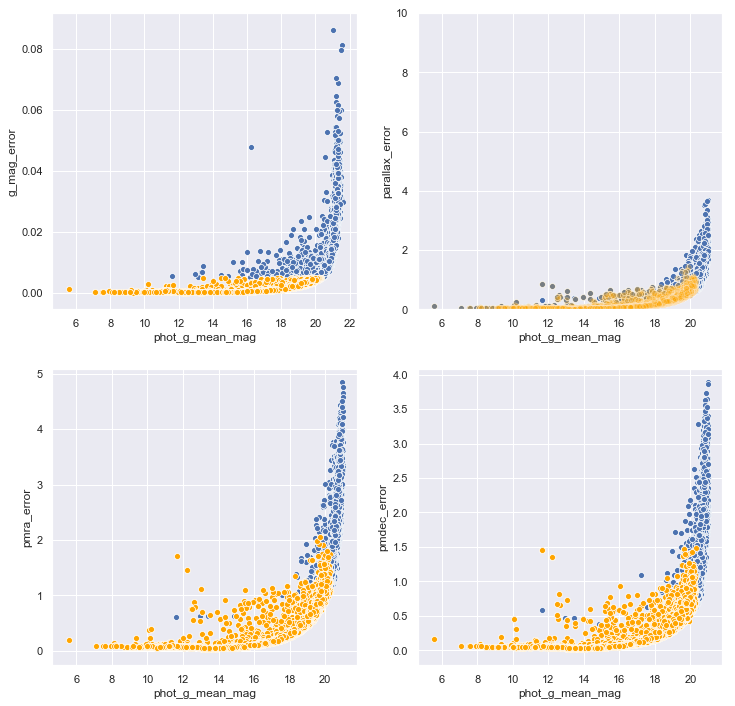

In [12]:
## Remove data with large noise 
mask = all_stars.g_mag_error < 0.005

plt.figure(figsize = (12,12))
plt.subplot(221)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.g_mag_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].g_mag_error, color = 'orange')

plt.subplot(222)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.parallax_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].parallax_error, color = 'orange', alpha = 0.25)
plt.ylim(0,10)


plt.subplot(223)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.pmra_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].pmra_error, color = 'orange')

plt.subplot(224)
sns.scatterplot(x=all_stars.phot_g_mean_mag, y=all_stars.pmdec_error, color = 'b')
sns.scatterplot(x=all_stars[mask].phot_g_mean_mag, y=all_stars[mask].pmdec_error, color = 'orange')
plt.show()

In [13]:
## Retrived percentage
len(all_stars[mask])/len(all_stars)

0.6366163826391391

In [14]:
all_stars = all_stars.loc[mask, :]

In [15]:
# calculating the distance from the parallax
all_stars['distance_pc'] = 1/(all_stars.parallax*0.001)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [16]:
print(len(all_stars))

# positive parallax
all_stars = all_stars[all_stars['parallax'] >= 0]
print(len(all_stars))

# dropping rows with null values in required columns
all_stars = all_stars[all_stars.loc[:, 'pmra'].notnull()]
all_stars = all_stars[all_stars.loc[:, 'parallax'].notnull()]
all_stars = all_stars[all_stars.loc[:, 'bp_rp'].notnull()]
print(len(all_stars))

# defining proper motion (pm) range
all_stars = all_stars[(abs(all_stars['pmra']) < 20) & (abs(all_stars['pmdec']) < 20)]
print(len(all_stars))

# taking stars within 60' = 1 deg radius
all_stars = all_stars[all_stars['dist'] < (60/60)]
print(len(all_stars))



12365
11384
11318
10347
10347


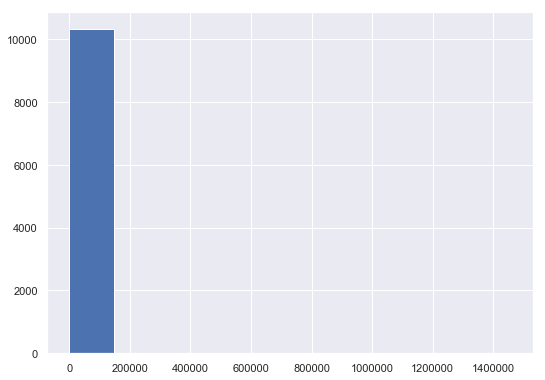

In [17]:
plt.hist(all_stars.distance_pc)
plt.show()

### Selecting cutoff to build GMM Model

In [18]:
def visualize_member(member, non_member, title = None):
    plt.figure(figsize=(14,14))

    if title:
        plt.suptitle(title)
    
    plt.subplot(221)
    sns.scatterplot(data = non_member, x='pmra', y='pmdec', label = 'non_member', color = 'tab:blue')
    sns.scatterplot(data = member, x='pmra', y='pmdec', label = 'member', color = 'tab:red')
    plt.xlabel('pmra (mas/yr)')
    plt.ylabel('pmdec (mas/yr)')

    plt.subplot(222)
    sns.distplot(non_member.parallax, label = 'non_member', color = 'tab:blue', kde = True)
    sns.distplot(member.parallax, label = 'member', color = 'tab:red', kde = True)
    plt.xlabel('Parallax (mas)')
    plt.ylabel('Probability Density [$mas^{-1}$]')
    plt.legend()
    
    plt.subplot(223)
    sns.scatterplot(data = member, x='g_rp', y='phot_g_mean_mag', color = 'tab:red', label = 'member')
    plt.gca().invert_yaxis()
    plt.ylabel('G Magnitude')
    plt.xlabel('G - RP Color')

    plt.subplot(224)
    sns.scatterplot(data = non_member, x='g_rp', y='phot_g_mean_mag', color = 'tab:blue', label = 'non member')
    plt.gca().invert_yaxis()
    plt.ylabel('G Magnitude')
    plt.xlabel('G - RP Color')

    plt.show()

In [19]:
def get_member(working_data, feature_columns, cutoff = 0.6,
               random_state = None):
    features = working_data.loc[:,feature_columns].dropna()

    if len(working_data) < 2:
        raise ValueError('Less than two stars in the data')
    
    # normalizing the features
    scaled_features = pd.DataFrame({})
    for column in features.columns:
        scaled_features[column] = (features[column] - np.median(features[column]))/np.std(features[column])

    from sklearn.mixture import GaussianMixture
    gmm = GaussianMixture(n_components=2, n_init = 5, 
                          random_state = random_state)
    gmm.fit(scaled_features)

    #predictions from gmm
    labels = gmm.predict(scaled_features)
    probs = gmm.predict_proba(scaled_features)

    working_data.loc[:, 'PMemb'] = probs[:, 0]
    working_data.loc[:, 'gmm_label'] = labels

    non_member_ind = working_data.loc[:, 'PMemb'] <= (1-cutoff)
    non_member = working_data.loc[non_member_ind, :]
    
    member_ind = working_data.loc[:, 'PMemb'] >= cutoff
    member = working_data.loc[member_ind, :]

    if np.std(member.pmra) > np.std(non_member.pmra):
        working_data.loc[:, 'PMemb'] = probs[:, 1]
        working_data.loc[:, 'gmm_label'] = 1-labels
        
        non_member_ind = working_data.loc[:, 'PMemb'] <= (1-cutoff)
        non_member = working_data.loc[non_member_ind, :]
        
        member_ind = working_data.loc[:, 'PMemb'] >= cutoff
        member = working_data.loc[member_ind, :]

    return member, non_member, gmm

In [20]:
def get_MSS_metric(member, non_member, feature_columns):
    # get modified silhouttee score from the given member and non_member

    if len(member) < 2 or len(non_member) < 2:
        return 0
    
    metric = np.zeros(len(feature_columns))
    for i in range(len(feature_columns)):
        feature_i = feature_columns[i]
        metric[i] = (np.std(non_member[feature_i]) - np.std(member[feature_i])) \
                / max(np.std(member[feature_i]), np.std(non_member[feature_i]), 1e-7)

    return metric.mean()

In [21]:
widths = np.linspace(5, 1000, 24).round(2)
widths

array([   5.  ,   48.26,   91.52,  134.78,  178.04,  221.3 ,  264.57,
        307.83,  351.09,  394.35,  437.61,  480.87,  524.13,  567.39,
        610.65,  653.91,  697.17,  740.43,  783.7 ,  826.96,  870.22,
        913.48,  956.74, 1000.  ])

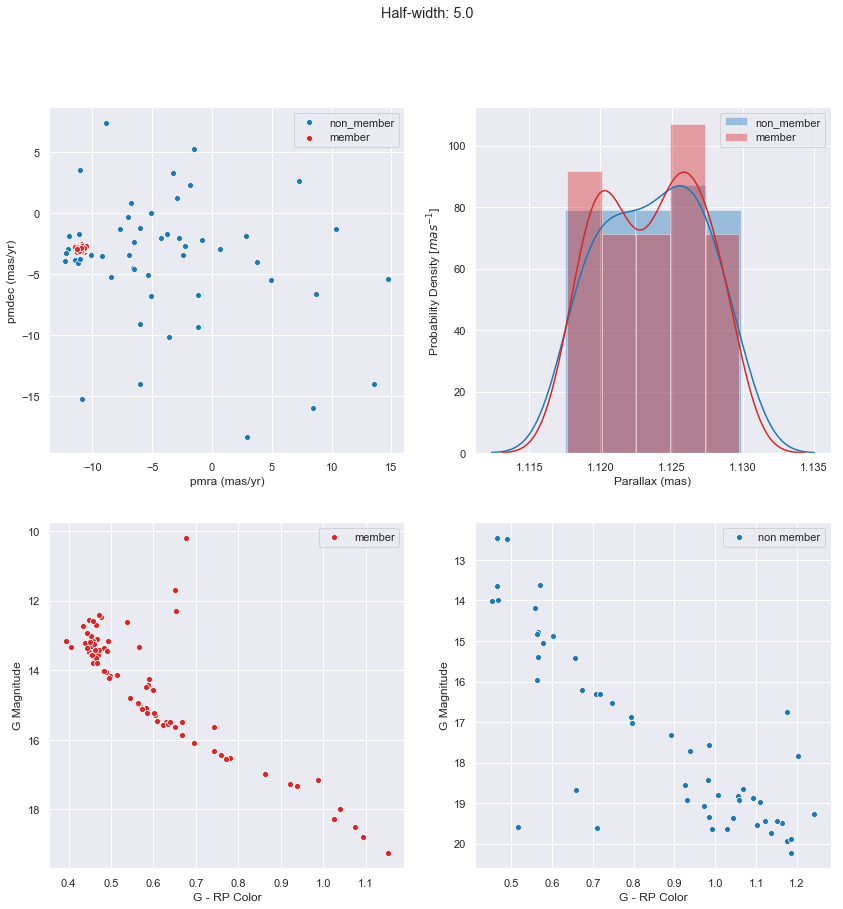

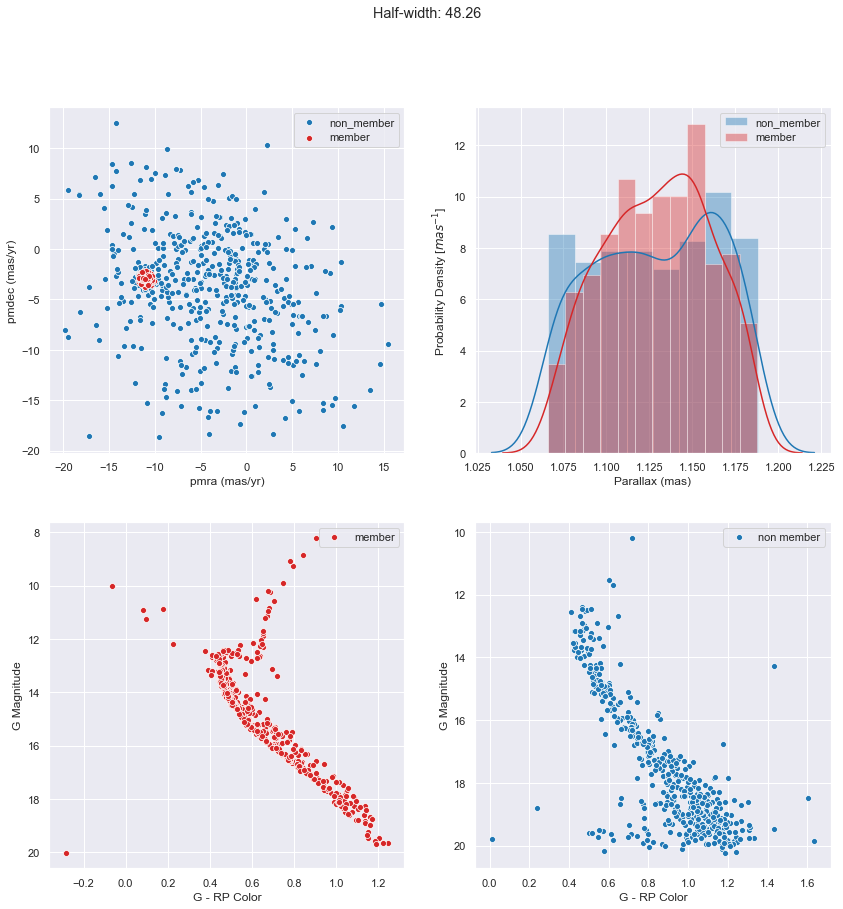

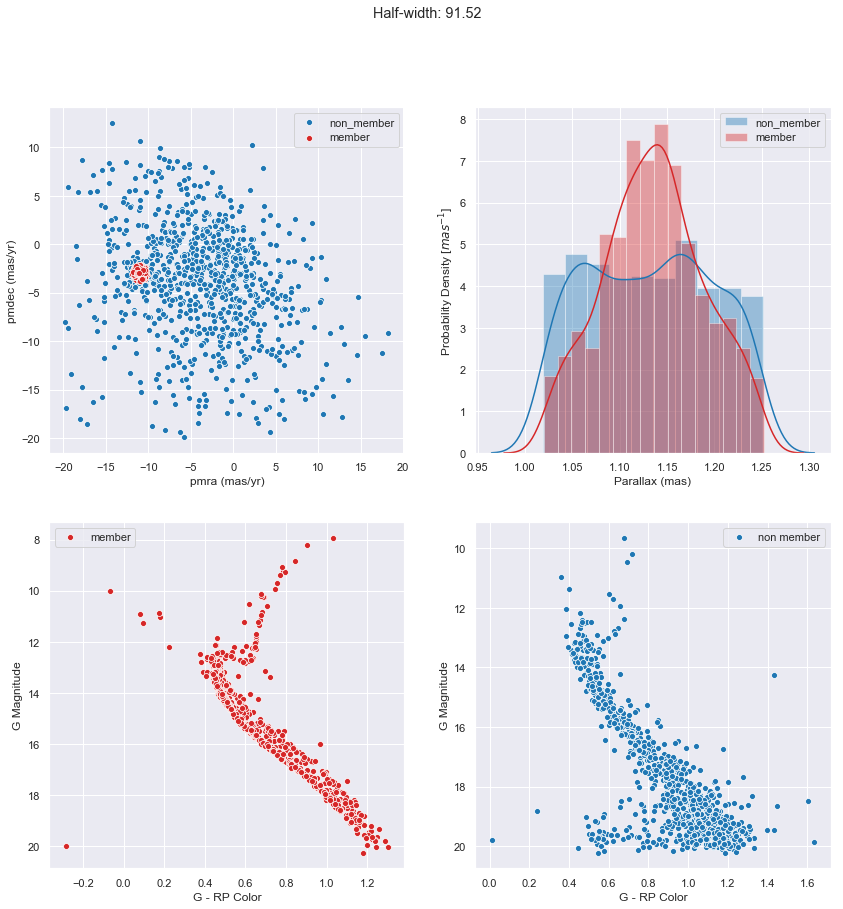

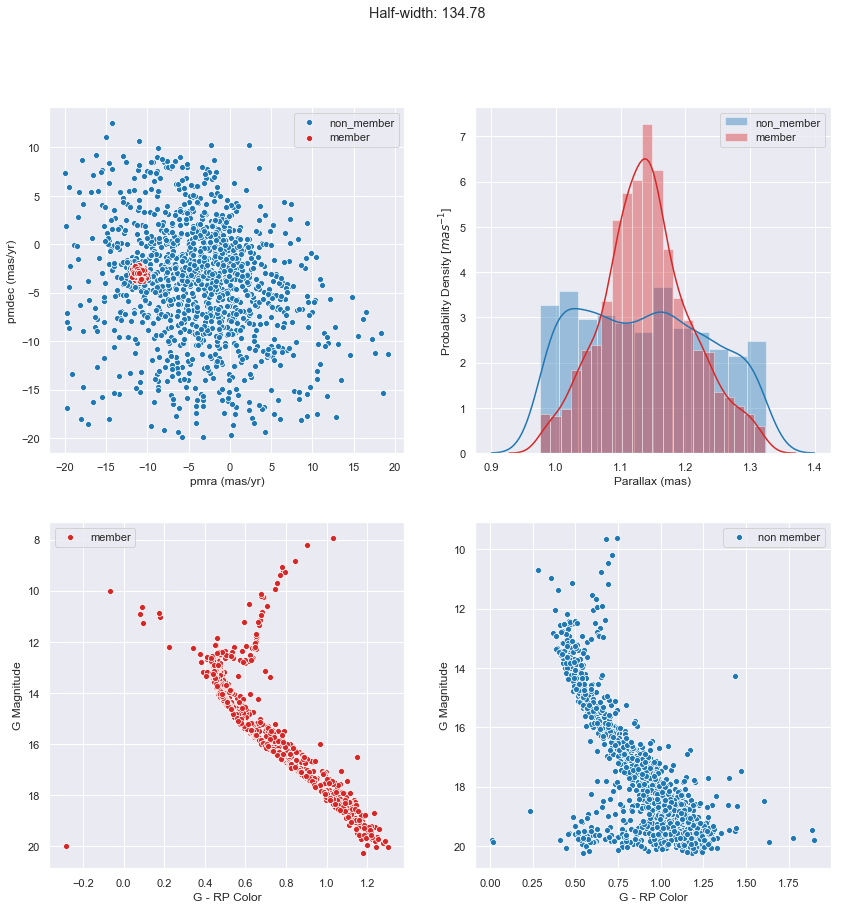

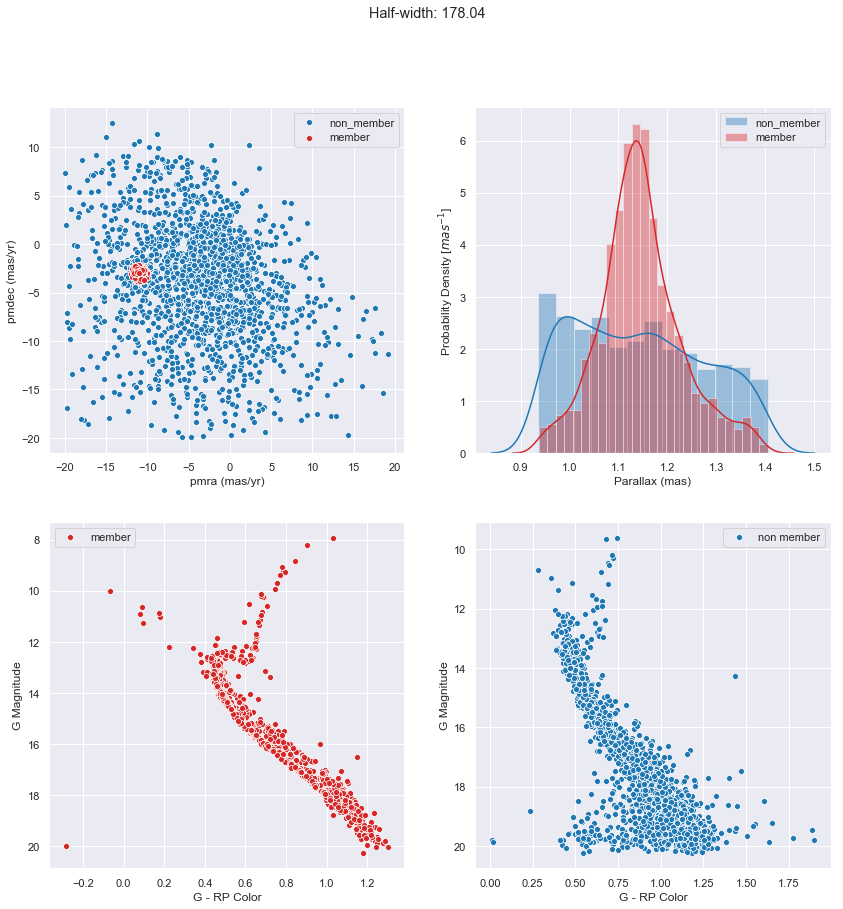

...

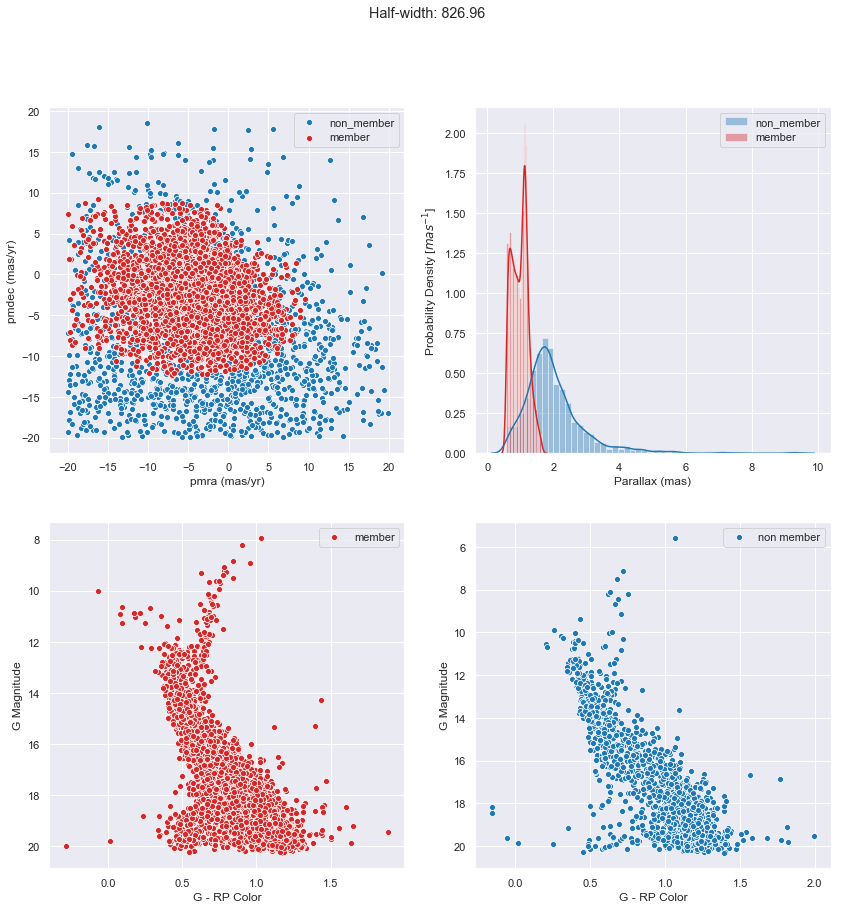

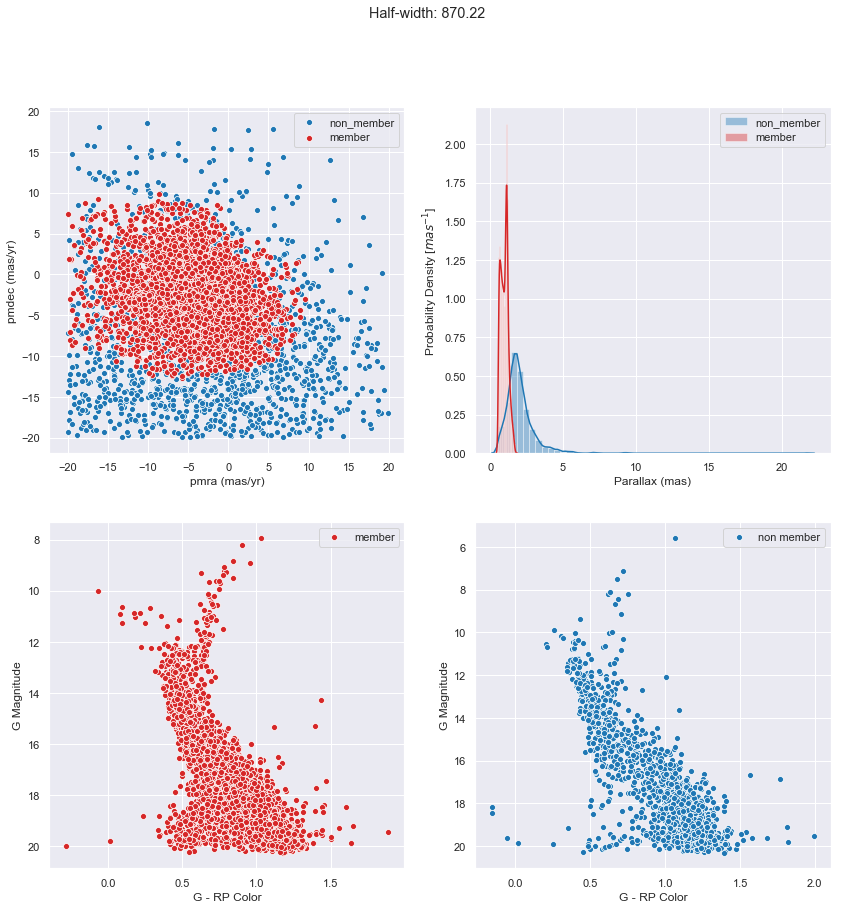

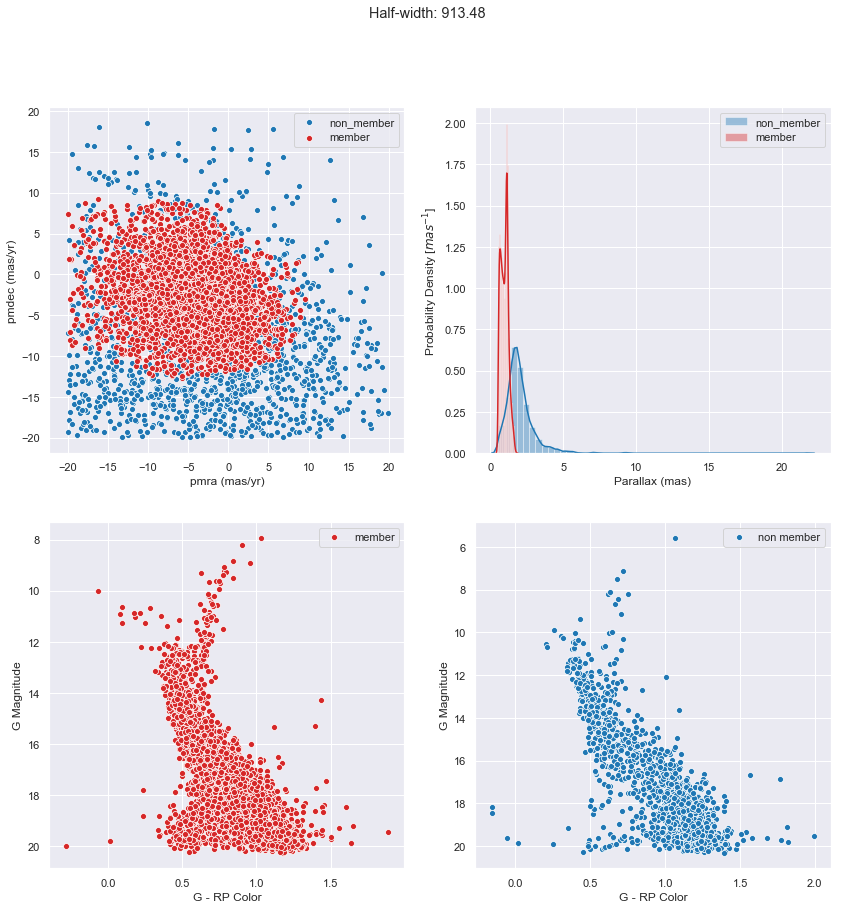

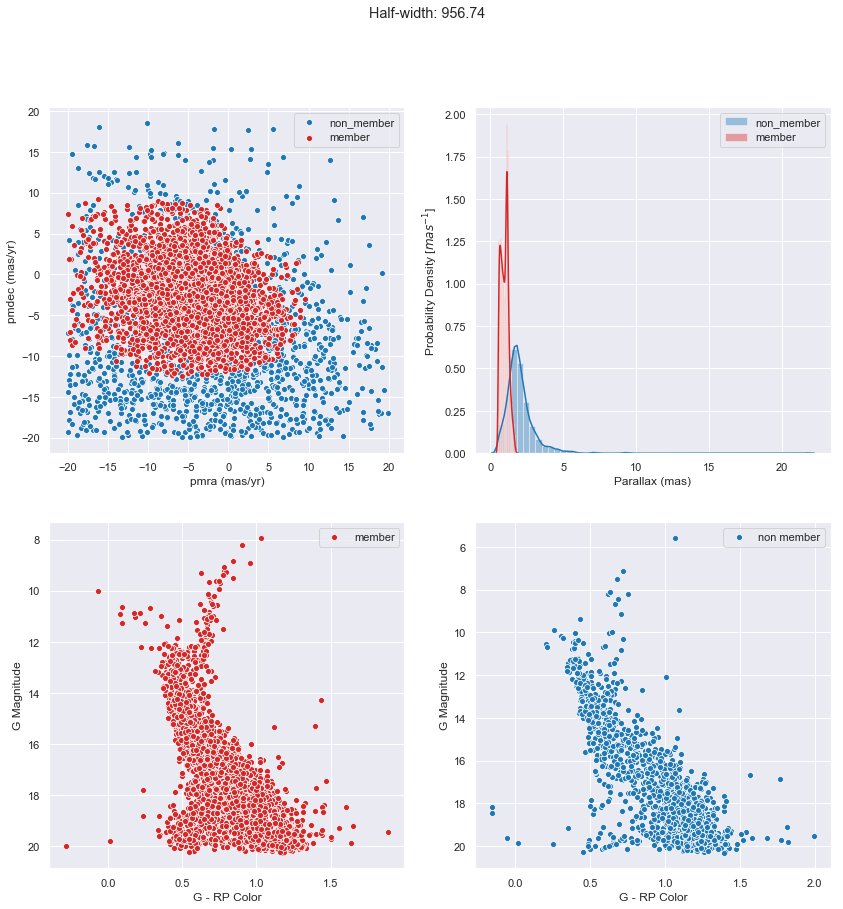

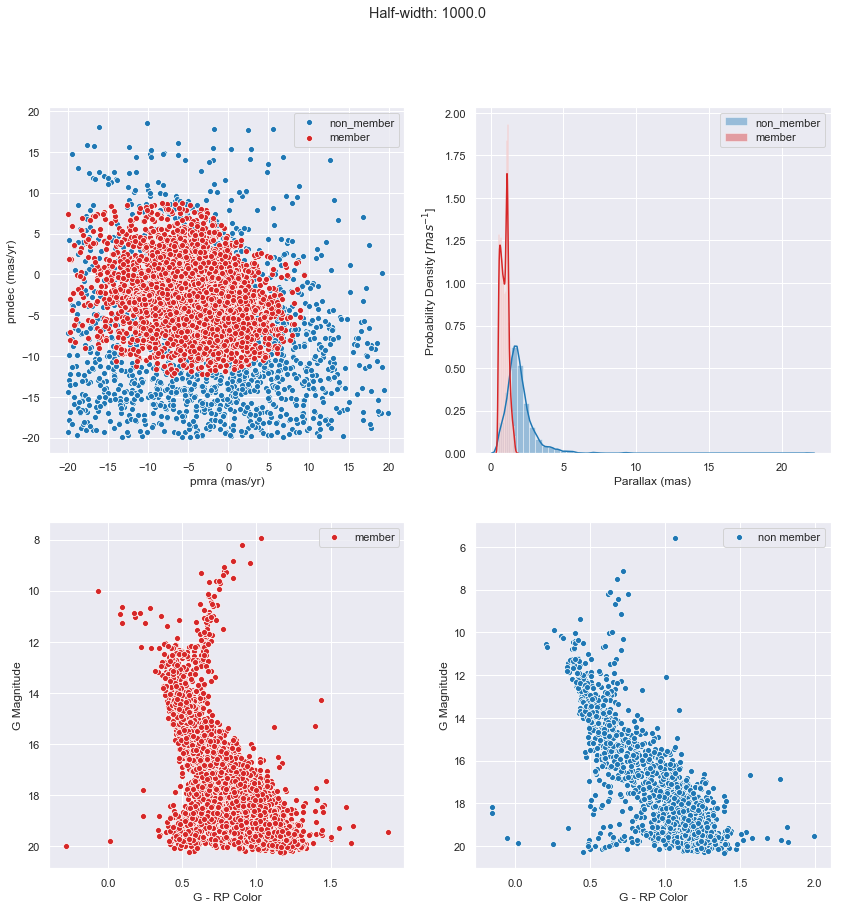

In [22]:
# distance of the cluster taken from Cantat-Gaudin (2020)
distance_literature = 890

import warnings
warnings.filterwarnings('ignore')

metrics = np.full(len(widths), -1, dtype='float')
n_members = np.full(len(widths), -1, dtype='float')
std = np.full((len(widths), 4), -1, dtype='float')

n_trial = 15

for i in range(len(widths)):
    metric_value = 0
    std[i] = [0,0,0,0]
    n_member = 0

    for _ in range(n_trial):
        width = widths[i]
        filter = abs(all_stars.distance_pc - distance_literature) < width
        working_data = all_stars[filter]

        feature_columns = ['pmra', 'pmdec', 'parallax']
        
        member, non_member, gmm = get_member(working_data, feature_columns)

        n_member += len(member)
        metric_value += get_MSS_metric(member, non_member, feature_columns)
        std[i] += [np.std(member.pmra), np.std(member.pmdec), 
                   np.std(non_member.pmra), np.std(non_member.pmdec)]
    
    metrics[i] = metric_value/n_trial
    std[i] /= n_trial
    n_members[i] = n_member / n_trial
    visualize_member(member, non_member, title=f'Half-width: {width}')

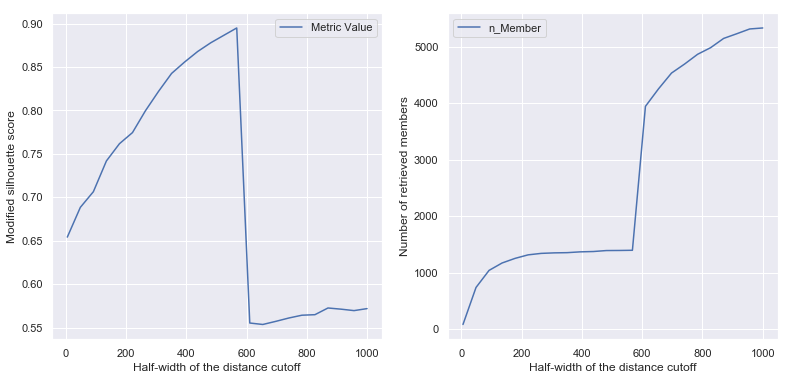

In [23]:
plt.figure(figsize = (13, 6))

plt.subplot(121)
sns.lineplot(widths, metrics, label = 'Metric Value')
plt.xlabel('Half-width of the distance cutoff')
plt.ylabel('Modified silhouette score')
plt.legend()

plt.subplot(122)
sns.lineplot(widths, n_members, label = 'n_Member')
plt.xlabel('Half-width of the distance cutoff')
plt.ylabel('Number of retrieved members')
plt.legend()
plt.show()

In [24]:
best_width = widths[np.nanargmax(metrics)]
best_width

567.39

#### Member Cutoff

In [17]:
distance_literature = 890
filter = abs(all_stars.distance_pc - distance_literature) < best_width
all_stars_filtered = all_stars.loc[filter, :]
len(all_stars_filtered)

6118

In [26]:
cutoffs = np.linspace(0.5, 0.95, 10)
MSS_metrics = []
n_members = []
for cutoff in cutoffs:
    member, non_member, gmm = get_member(all_stars_filtered, 
                                         feature_columns, cutoff=cutoff)
    MSS = get_MSS_metric(member, non_member, feature_columns)
    MSS_metrics.append(MSS)
    n_members.append(len(member))

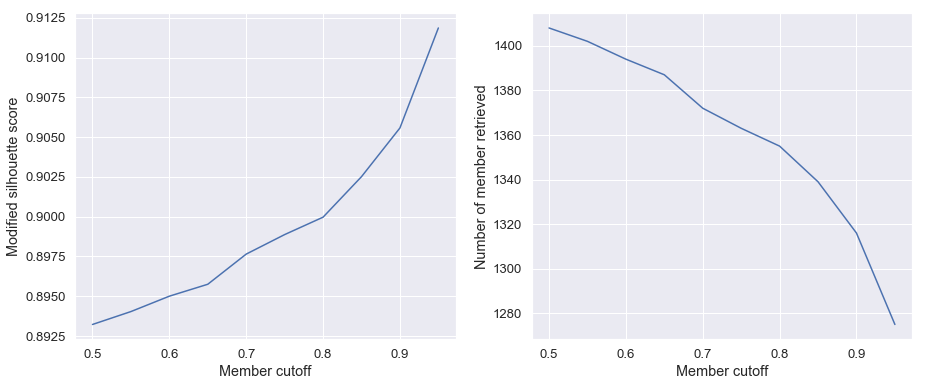

In [27]:
plt.figure(figsize = (15, 6))
sns.set(font_scale = 1.2)

plt.subplot(121)
sns.lineplot(cutoffs, MSS_metrics)
plt.xlabel('Member cutoff')
plt.ylabel('Modified silhouette score')

plt.subplot(122)
sns.lineplot(cutoffs, n_members)
plt.xlabel('Member cutoff')
plt.ylabel('Number of member retrieved')
plt.show()

In [28]:
best_cutoff = cutoffs[np.nanargmax(MSS_metrics)]
best_cutoff

0.95

### Building GMM Model


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


number of member: 1274,
 number of field star: 4634,
 MSS: 0.91


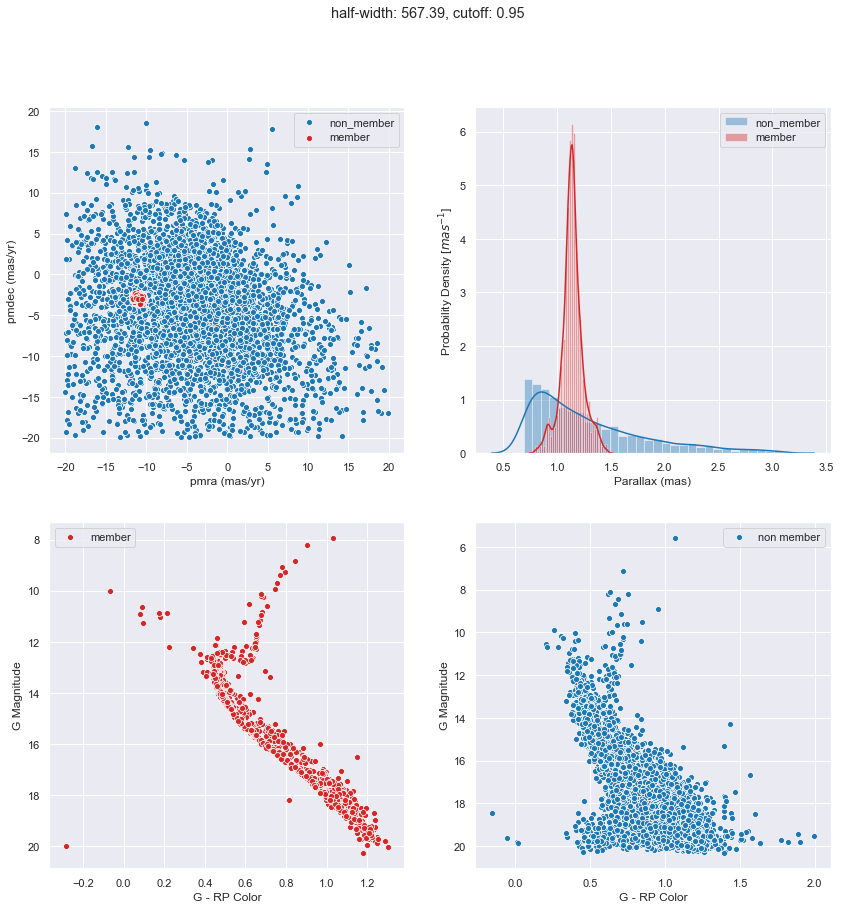

In [22]:
cutoff = best_cutoff

feature_columns = ['pmra', 'pmdec', 'parallax']

member, non_member, gmm = get_member(all_stars_filtered, feature_columns, 
                                     cutoff=cutoff, random_state = 42)

MSS = get_MSS_metric(member, non_member, feature_columns)
print(f'number of member: {len(member)},\n number of field star: {len(non_member)},\n MSS: {MSS:0.2f}') 

visualize_member(member, non_member, title=f'half-width: {best_width}, cutoff: {cutoff}')

### Comparing with Gao Paper

#### Members and Covariance Matrix

Depending on the cutoff on PMemb, the number of stars are following:
* Likely member (PMemb >= 0.6) = 1401
* High-probability member (PMemb >= 0.95) = 1256
* Zero-probability field star (PMemb = 0) = 5720

And the covariance matrix for field stars group, $\sum_f$ and the member group $\sum_c$ are following:


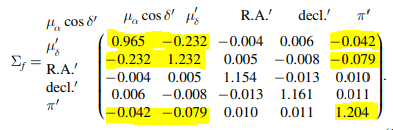

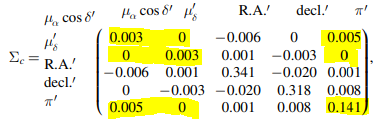

In [30]:
gmm.covariances_.round(3)

array([[[ 0.002, -0.   ,  0.003],
        [-0.   ,  0.003, -0.   ],
        [ 0.003, -0.   ,  0.067]],

       [[ 1.036, -0.23 , -0.115],
        [-0.23 ,  1.286, -0.147],
        [-0.115, -0.147,  1.254]]])

In [31]:
print('Number of sample stars:', len(all_stars_filtered))

Number of sample stars: 6118


In [32]:
print('n(PMemb >= 0.6) =', sum(all_stars_filtered.PMemb >= 0.6))
print('n(PMemb >= 0.95) =', sum(all_stars_filtered.PMemb >= 0.95))
print('n(PMemb <= 0.0001) =', sum(all_stars_filtered.PMemb <= 0.0001))

n(PMemb >= 0.6) = 1394
n(PMemb >= 0.95) = 1274
n(PMemb <= 0.0001) = 4558


#### Figure 1
PMemb histogram and the plot for PMemb vs G band magnitude.

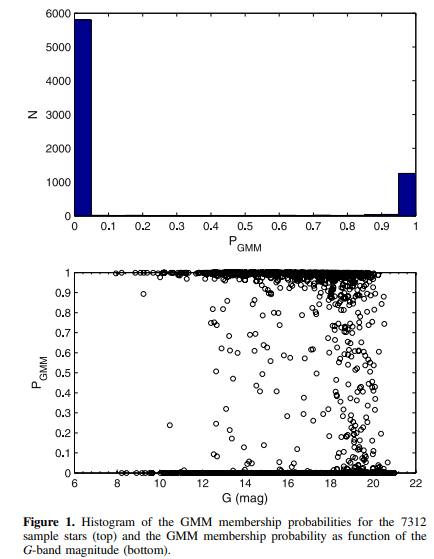


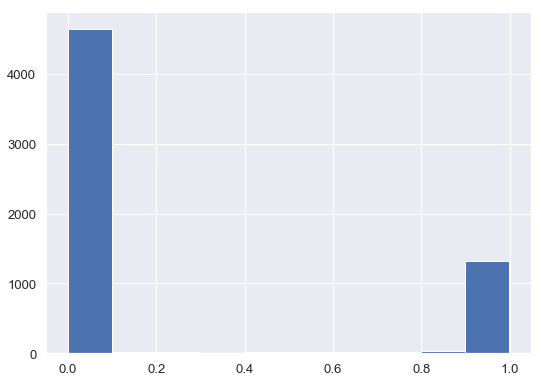

In [33]:
plt.hist(all_stars_filtered.PMemb)
plt.show()

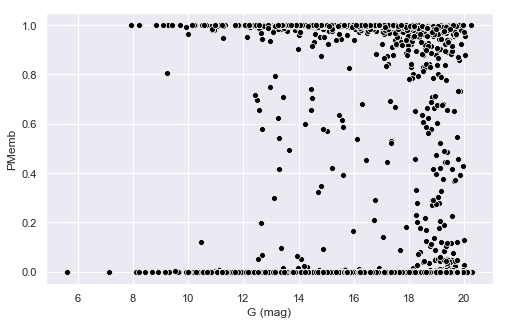

In [23]:
plt.figure(figsize=(8,5))
sns.scatterplot(x='phot_g_mean_mag', y = 'PMemb', data = all_stars_filtered, color = 'black')
plt.xlabel('G (mag)')
plt.show()

#### Figure 2
Proper Motion Plot

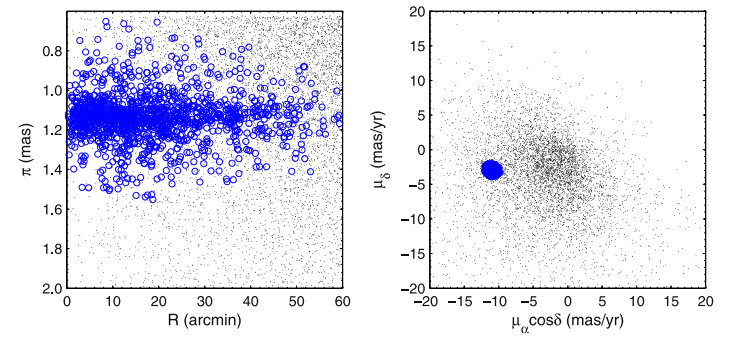

In [35]:
training_data = pd.concat([member.assign(member=1), non_member.assign(member=0)])
training_data.head()

,solution_id,designation,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,dist,g_mag_error,distance_pc,PMemb,gmm_label,member
0,1635721458409799680,b'Gaia DR2 604917629355038848',604917629355038848,309606362,2015.5,132.845427,0.033842,11.813721,0.022365,1.129222,...,5.409647,5.116649,5.702646,b'https://gea.esac.esa.int/data-server/datalin...,0.000629,0.000205,885.565629,0.998999,0,1
2,1635721458409799680,b'Gaia DR2 604917732434252032',604917732434252032,1037136882,2015.5,132.847883,0.047155,11.818284,0.028357,1.113444,...,0.286409,0.253650,0.319167,b'https://gea.esac.esa.int/data-server/datalin...,0.004667,0.000698,898.114453,0.998589,0,1
3,1635721458409799680,b'Gaia DR2 604917732434325248',604917732434325248,1685360922,2015.5,132.845628,0.023422,11.820310,0.014362,1.125087,...,3.119858,2.927116,3.312600,b'https://gea.esac.esa.int/data-server/datalin...,0.006326,0.000288,888.820446,0.998815,0,1
4,1635721458409799680,b'Gaia DR2 604917629355039360',604917629355039360,340729517,2015.5,132.846939,0.039546,11.807362,0.023041,1.111626,...,1.604247,1.452243,1.756252,b'https://gea.esac.esa.int/data-server/datalin...,0.006695,0.000869,899.583451,0.996445,0,1
5,1635721458409799680,b'Gaia DR2 604917698074587136',604917698074587136,1308383390,2015.5,132.840032,0.034797,11.817361,0.020084,1.189351,...,0.544629,0.501133,0.588124,b'https://gea.esac.esa.int/data-server/datalin...,0.006747,0.000606,840.794499,0.999011,0,1


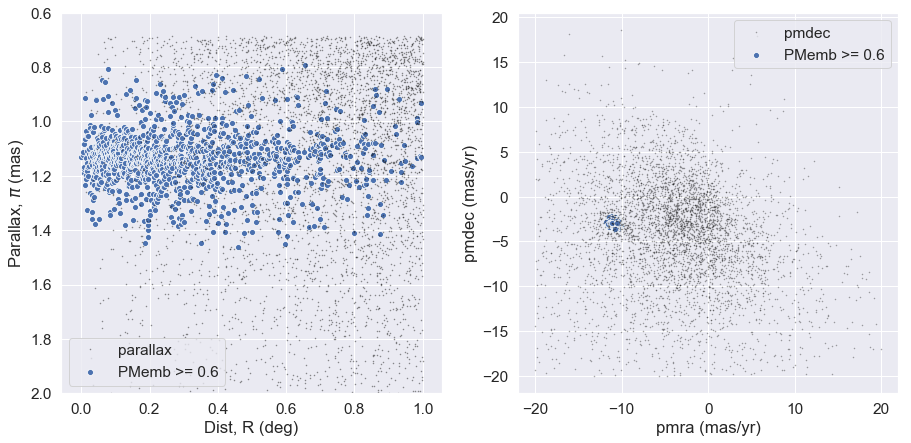

In [36]:
sns.set(font_scale = 1.4)

plt.figure(figsize = (15,7))

plt.subplot(121)
plt.plot(non_member['dist'], non_member['parallax'], 'k.',  alpha = 0.5,
         markersize = 1)
plt.gca().invert_yaxis()
sns.scatterplot('dist', 'parallax', data = member, label = 'PMemb >= 0.6')
plt.xlabel('Dist, R (deg)')
plt.ylabel('Parallax, $\pi$ (mas)')
plt.legend()
plt.ylim(2,0.6)

plt.subplot(122)
plt.plot(non_member['pmra'], non_member['pmdec'], 'k.', alpha = 0.4, 
         markersize = 1)
sns.scatterplot('pmra', 'pmdec', data = member, label = 'PMemb >= 0.6')
plt.ylabel('pmdec (mas/yr)')
plt.xlabel('pmra (mas/yr)')
plt.legend()
plt.show()

#### Figure 3: CMD
Color-Magnitude Diagram

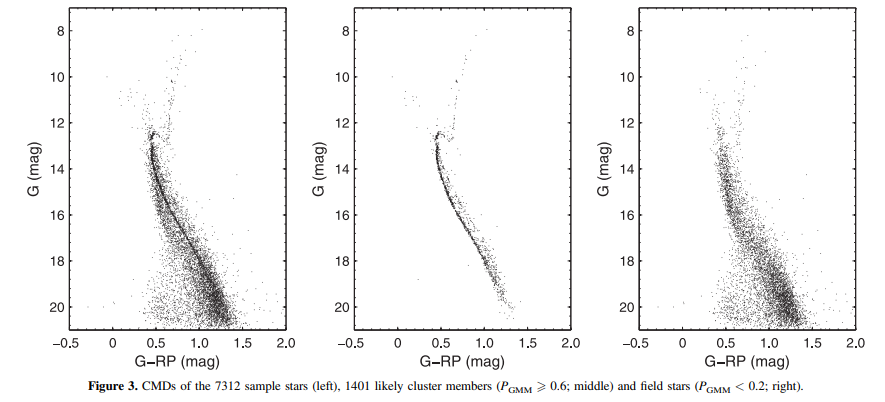

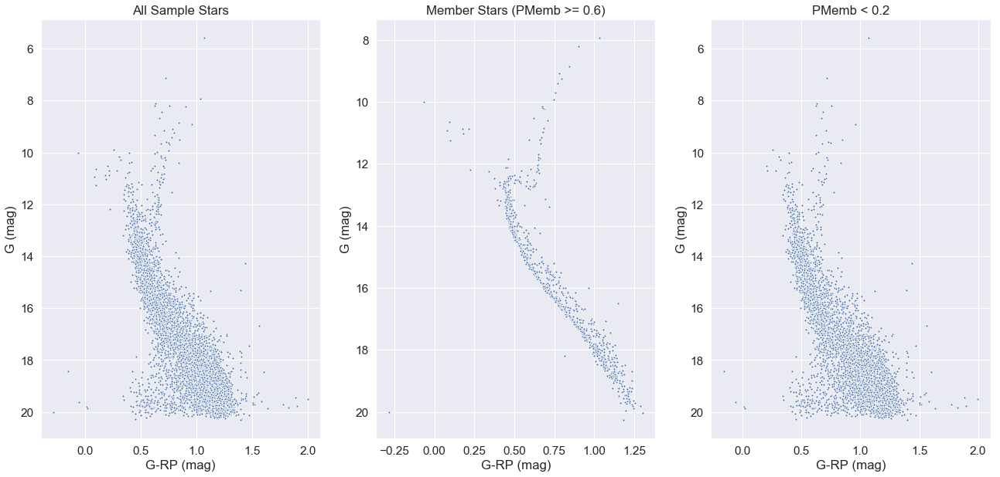

In [37]:
fig, axes = plt.subplots(1, 3, figsize=(22,10))
#fig.suptitle('CMD of Training data for M67')

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag',
                data = training_data, ax = axes[0], marker = '.')
axes[0].set_title('All Sample Stars')
axes[0].set_xlabel('G-RP (mag)')
axes[0].set_ylabel('G (mag)')
axes[0].invert_yaxis()

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag', marker = '.',
                data = member, ax = axes[1])
axes[1].set_title('Member Stars (PMemb >= 0.6)')
axes[1].set_xlabel('G-RP (mag)')
axes[1].set_ylabel('G (mag)')
axes[1].invert_yaxis()

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag',  marker = '.',
                data = non_member[non_member.PMemb < 0.2], ax = axes[2])
axes[2].set_title('PMemb < 0.2')
axes[2].invert_yaxis()
axes[2].set_xlabel('G-RP (mag)')
axes[2].set_ylabel('G (mag)')

plt.show()


#### Distribution of features

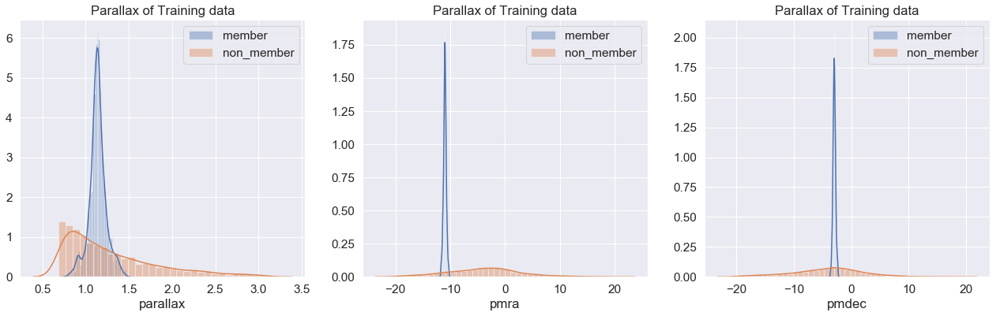

In [38]:
plt.figure(figsize = (22,6))

plt.subplot(131)
sns.distplot(member.parallax, label='member')
sns.distplot(non_member.parallax, label = 'non_member')
plt.title('Parallax of Training data')
plt.legend()

plt.subplot(132)
sns.distplot(member.pmra, label='member')
sns.distplot(non_member.pmra, label = 'non_member')
plt.title('pmra of Training data')
plt.legend()

plt.subplot(133)
sns.distplot(member.pmdec, label='member')
sns.distplot(non_member.pmdec, label = 'non_member')
plt.title('pmdec of Training data')
plt.legend()

plt.show()

### Random Forest

In [25]:
training_data = pd.concat([member.assign(member=1), non_member.assign(member=0)])
training_data.head()

,solution_id,designation,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,dist,g_mag_error,distance_pc,PMemb,gmm_label,member
0,1635721458409799680,b'Gaia DR2 604917629355038848',604917629355038848,309606362,2015.5,132.845427,0.033842,11.813721,0.022365,1.129222,...,5.409647,5.116649,5.702646,b'https://gea.esac.esa.int/data-server/datalin...,0.000629,0.000205,885.565629,0.998999,0,1
2,1635721458409799680,b'Gaia DR2 604917732434252032',604917732434252032,1037136882,2015.5,132.847883,0.047155,11.818284,0.028357,1.113444,...,0.286409,0.253650,0.319167,b'https://gea.esac.esa.int/data-server/datalin...,0.004667,0.000698,898.114453,0.998589,0,1
3,1635721458409799680,b'Gaia DR2 604917732434325248',604917732434325248,1685360922,2015.5,132.845628,0.023422,11.820310,0.014362,1.125087,...,3.119858,2.927116,3.312600,b'https://gea.esac.esa.int/data-server/datalin...,0.006326,0.000288,888.820446,0.998815,0,1
4,1635721458409799680,b'Gaia DR2 604917629355039360',604917629355039360,340729517,2015.5,132.846939,0.039546,11.807362,0.023041,1.111626,...,1.604247,1.452243,1.756252,b'https://gea.esac.esa.int/data-server/datalin...,0.006695,0.000869,899.583451,0.996445,0,1
5,1635721458409799680,b'Gaia DR2 604917698074587136',604917698074587136,1308383390,2015.5,132.840032,0.034797,11.817361,0.020084,1.189351,...,0.544629,0.501133,0.588124,b'https://gea.esac.esa.int/data-server/datalin...,0.006747,0.000606,840.794499,0.999011,0,1


In [26]:
# Examining the descriptive statistics of each column
training_data.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,...,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist,g_mag_error,distance_pc,PMemb,gmm_label,member
count,5.908000e+03,5.908000e+03,5.908000e+03,5908.0,5908.000000,5908.000000,5908.000000,5908.000000,5908.000000,5908.000000,...,2438.000000,2438.000000,2438.000000,2438.000000,5908.000000,5908.000000,5908.000000,5.908000e+03,5908.00000,5908.00000
mean,1.635721e+18,6.035633e+17,8.524138e+08,2015.5,132.845529,0.180714,11.816036,0.117774,1.255465,0.230917,...,1.534381,4.117613,3.856173,4.379052,0.589843,0.001625,891.042300,2.147582e-01,0.78436,0.21564
std,0.000000e+00,3.003749e+15,4.871041e+08,0.0,0.467470,0.163197,0.464623,0.107163,0.475097,0.209728,...,3.196324,33.647640,31.751328,35.547482,0.277967,0.001403,271.941737,4.092130e-01,0.41130,0.41130
min,1.635721e+18,5.986153e+17,2.657300e+04,2015.5,131.835038,0.017678,10.818079,0.011441,0.686520,0.020817,...,0.512218,0.039763,0.036985,0.042542,0.000629,0.000125,323.188590,0.000000e+00,0.00000,0.00000
25%,1.635721e+18,5.989720e+17,4.401983e+08,2015.5,132.505363,0.040693,11.480663,0.027077,0.925427,0.051924,...,0.797990,0.281840,0.240828,0.320161,0.361382,0.000413,705.964242,0.000000e+00,1.00000,0.00000
50%,1.635721e+18,6.049053e+17,8.566396e+08,2015.5,132.846325,0.119041,11.814219,0.077145,1.136086,0.151709,...,1.003411,0.650595,0.584875,0.712966,0.632703,0.001106,880.214831,3.083758e-168,1.00000,0.00000
75%,1.635721e+18,6.049894e+17,1.275009e+09,2015.5,133.179124,0.288100,12.148327,0.187951,1.416502,0.370288,...,1.406636,1.955238,1.794149,2.098127,0.833247,0.002631,1080.582097,4.857197e-13,1.00000,0.00000
max,1.635721e+18,6.081334e+17,1.692558e+09,2015.5,133.857522,0.914358,12.807801,0.641737,3.094169,1.310992,...,88.923782,1196.576782,1135.376587,1257.776978,0.999960,0.004999,1456.621578,9.991386e-01,1.00000,1.00000


In [27]:
# Choosing the features

feature_columns = ['pmra', 'pmdec',
                   'parallax', 'phot_g_mean_mag',
                   "phot_bp_mean_mag", 'phot_rp_mean_mag',
                   'bp_rp', 'bp_g', 'g_rp']

features = training_data.loc[:,feature_columns]
targets = training_data['member']

In [28]:
# Dropping the NULL values from the using training set
# adding features and targets in a training set
training_set = pd.concat((features, targets), axis=1)

# dropping NA
training_set = training_set.dropna()

# finding where dtype is float64
float64_data = np.where(training_set.dtypes == 'float64')[0] 

# change the data type to float32 from float64
training_set.iloc[:, float64_data] = training_set.iloc[:, float64_data].astype('float32')


# set features, targets again
features, targets = training_set.iloc[:,:-1], training_set.iloc[:,-1]

features.describe()

,pmra,pmdec,parallax,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,bp_rp,bp_g,g_rp
count,5908.000000,5908.000000,5908.000000,5908.000000,5908.000000,5908.000000,5908.000000,5908.000000,5908.000000
mean,-5.390935,-3.837091,1.255466,17.071323,17.802046,16.217531,1.584483,0.730692,0.853797
std,6.606390,5.404550,0.475097,2.321504,2.559148,2.110794,0.589291,0.333574,0.272666
min,-19.999044,-19.973394,0.686520,5.592662,6.941972,4.524381,-0.521719,-0.564203,-0.284916
25%,-10.913007,-6.509486,0.925427,15.381892,15.848603,14.753986,1.044285,0.431197,0.606216
50%,-5.856175,-3.040318,1.136086,17.611234,18.476658,16.677201,1.599471,0.712745,0.869264
75%,-0.948598,-1.331468,1.416502,19.062657,20.008962,17.978319,2.088179,0.990410,1.092491
max,19.932800,18.545561,3.094169,20.294615,21.550045,20.294409,2.994736,1.707638,1.996153


In [29]:
targets.value_counts()

0    4634
1    1274
Name: member, dtype: int64

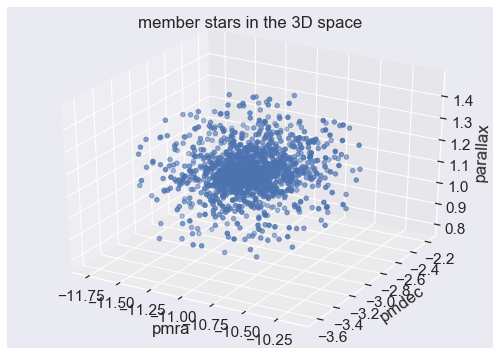

In [44]:
from mpl_toolkits.mplot3d import Axes3D


ax = plt.figure().gca(projection='3d')

ax.scatter(member.pmra, member.pmdec, member.parallax)
ax.set_xlabel('pmra')
ax.set_ylabel('pmdec')
ax.set_zlabel('parallax')
plt.title('member stars in the 3D space')
plt.show()


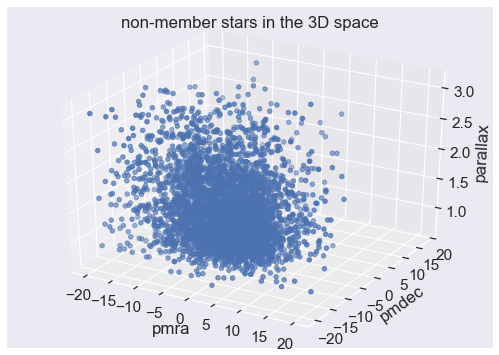

In [45]:
ax = plt.figure().gca(projection='3d')

ax.scatter(non_member.pmra, non_member.pmdec, non_member.parallax)
ax.set_xlabel('pmra')
ax.set_ylabel('pmdec')
ax.set_zlabel('parallax')
plt.title('non-member stars in the 3D space')
plt.show()


### Feature Importance

#### Mean Decrease in Impurity (MDI)

In [46]:
# Use Random Forest on whole dataset using 1000 different trees 
rfc = RandomForestClassifier(n_estimators = 1000, oob_score = True)
rfc.fit(features, targets)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=1000, n_jobs=None,
            oob_score=True, random_state=None, verbose=0, warm_start=False)

In [47]:
# checking the feature importance, 
# ( this is higher for a variable if the model efficiency become lower as we remove that variable)
feature_imp = pd.Series(rfc.feature_importances_, index=features.columns).sort_values(ascending = False)
feature_imp

pmra                0.507361
pmdec               0.278005
parallax            0.102915
phot_rp_mean_mag    0.035986
phot_g_mean_mag     0.028205
phot_bp_mean_mag    0.017180
g_rp                0.013652
bp_rp               0.008799
bp_g                0.007897
dtype: float64

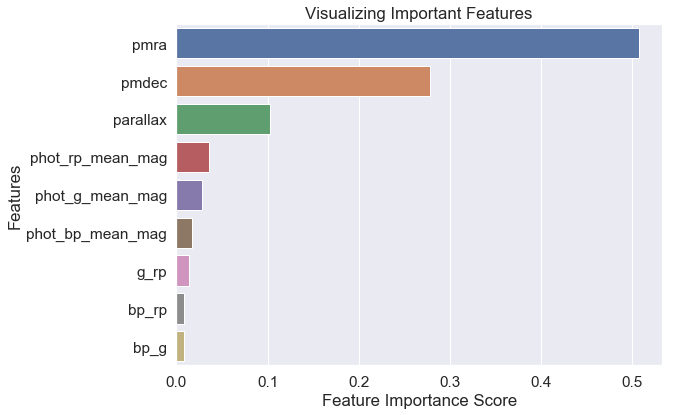

In [48]:
# plotting as a barplot
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to the graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.show()

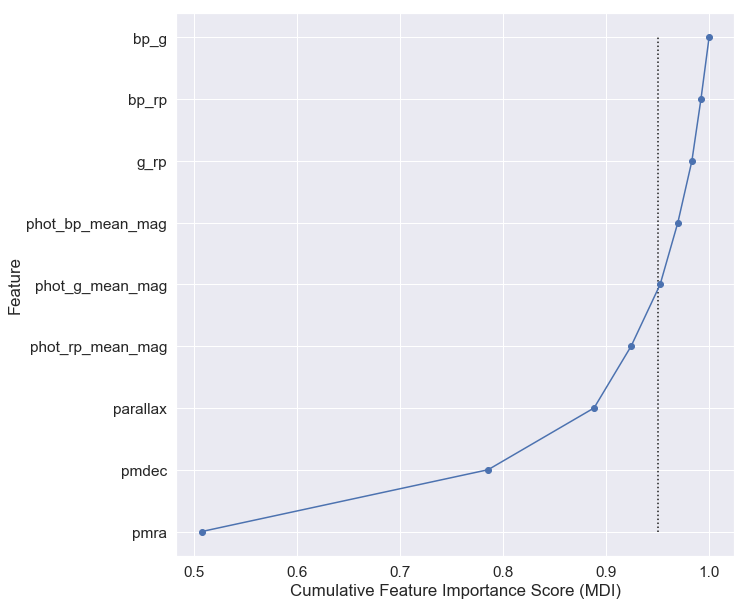

In [53]:
#evaluate the cumulative
plt.figure(figsize=(10,10))
cumulative = np.cumsum(feature_imp)
plt.plot(cumulative, feature_imp.index, marker = 'o')
plt.vlines(0.95, 0, len(cumulative)-1, linestyles = ":")
plt.ylabel('Feature')
plt.xlabel('Cumulative Feature Importance Score (MDI)')
plt.show()

In [54]:
max_index = np.where(cumulative > 0.95)[0][0]
max_index

4

In [55]:
imp_feature_columns = feature_imp.index[:max_index+1]
imp_feature_columns

Index(['pmra', 'pmdec', 'parallax', 'phot_rp_mean_mag', 'phot_g_mean_mag'], dtype='object')

#### SHAP feature importance

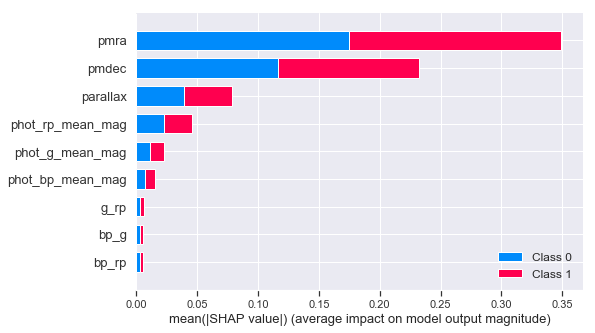

In [71]:
import shap
rfc.fit(features, targets)

shap_values = shap.TreeExplainer(rfc).shap_values(features)
shap.summary_plot(shap_values, features)

In [72]:
shap_values = np.array(shap_values)
len(train_features), len(shap_values[0])

(4135, 5908)

In [73]:
# mean of absolute SHAP values for class 1 (member)
feature_imp_member = abs(shap_values[1,:,:]).mean(axis=0)
# mean of absolute SHAP values for class 0 (non_member)
feature_imp_non_member = abs(shap_values[1,:,:]).mean(axis=0)

In [74]:
# overall feature imp
feature_imp = feature_imp_member+feature_imp_non_member
#normalizing
feature_imp /= feature_imp.sum()

In [75]:
sorted_order = feature_imp.argsort()[::-1]
sorted_feature_imp = feature_imp[sorted_order]

In [76]:
sorted_feature_columns = feature_columns[sorted_order]

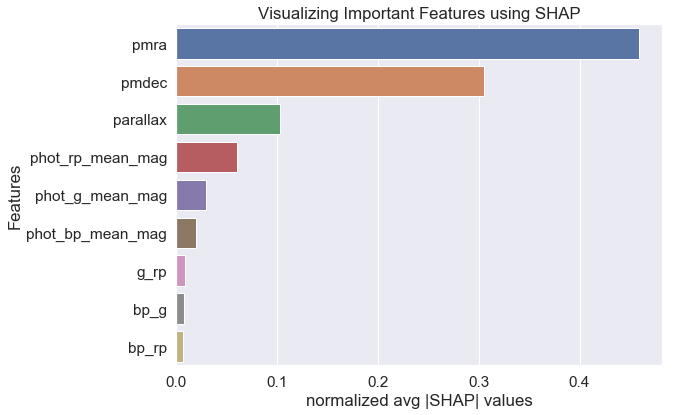

In [77]:
# plotting as a barplot
# Creating a bar plot
sns.barplot(x=sorted_feature_imp, 
            y=sorted_feature_columns)
# Add labels to the graph
plt.xlabel('normalized avg |SHAP| values')
plt.ylabel('Features')
plt.title("Visualizing Important Features using SHAP")
plt.show()

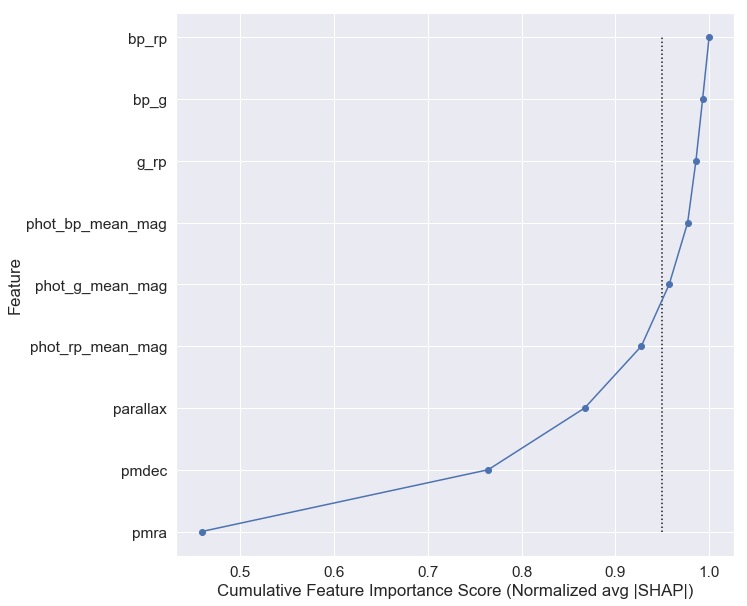

In [78]:
#evaluate the cumulative
plt.figure(figsize=(10,10))
cumulative = np.cumsum(sorted_feature_imp)
plt.plot(cumulative, sorted_feature_columns, marker = 'o')
plt.vlines(0.95, 0, len(cumulative)-1, linestyles = ":")
plt.ylabel('Feature')
plt.xlabel('Cumulative Feature Importance Score (Normalized avg |SHAP|)')
plt.show()

In [79]:
max_index = np.where(cumulative > 0.95)[0][0]
max_index

4

In [80]:
imp_feature_columns = sorted_feature_columns[:max_index+1]
imp_feature_columns 

array(['pmra', 'pmdec', 'parallax', 'phot_rp_mean_mag', 'phot_g_mean_mag'],
      dtype='<U16')

### Model Selection and Accuracy Estimate using Test Data

In [30]:
features = training_data.loc[:,imp_feature_columns]
targets = training_data['member']

features.head()

,pmra,pmdec,parallax,phot_rp_mean_mag,phot_g_mean_mag
0,-10.956961,-3.093306,1.129222,12.113283,12.562178
2,-11.261058,-3.060736,1.113444,15.248243,15.941956
3,-10.902709,-3.153121,1.125087,12.773678,13.167254
4,-10.978362,-3.395680,1.111626,13.436893,14.060972
5,-10.941340,-2.921289,1.189351,14.436324,15.012680


In [31]:
from sklearn.model_selection import train_test_split
# splitting our dataset using 0.3 test ratio (30% test data, 70% train data)
train_features, test_features, train_targets, test_targets = train_test_split(features,
                                                                              targets,
                                                                              test_size = 0.3, 
                                                                              stratify = targets,
                                                                              random_state=258)

In [32]:
# testing if the splited data have similar percentage of member and non-member

print(f'Propostion of class:\n \
 original target data:\n{targets.value_counts()/len(targets)} \n\
 test_targets: \n{test_targets.value_counts()/len(test_targets)} \n\
 train_targets: \n{train_targets.value_counts()/len(train_targets)}')

Propostion of class:
  original target data:
0    0.78436
1    0.21564
Name: member, dtype: float64 
 test_targets: 
0    0.784546
1    0.215454
Name: member, dtype: float64 
 train_targets: 
0    0.784281
1    0.215719
Name: member, dtype: float64


In [33]:
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import precision_score, recall_score, classification_report

In [34]:
def evaluate_model(model):
    test_predict = model.predict(test_features)
    train_predict = model.predict(train_features)

    print('Model Accuracy:')
    print("Precision on training data: %.3f" % precision_score(train_targets, train_predict))
    print("Precision on testing data: %.3f" % precision_score(test_targets, test_predict))
    print('Accuracy on test data: %.3f' % accuracy_score(test_targets, test_predict))


    sns.heatmap(confusion_matrix(test_targets, test_predict), cmap= 'Greens', annot = True)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix')
    plt.show()

    print("Classification Report: \n", classification_report(test_targets, test_predict))

#### Random Forest Hyperparameter Tuning

We will optimize the parameteres of random forest model using cross-validation.

Model Accuracy:
Precision on training data: 1.000
Precision on testing data: 1.000
Accuracy on test data: 1.000


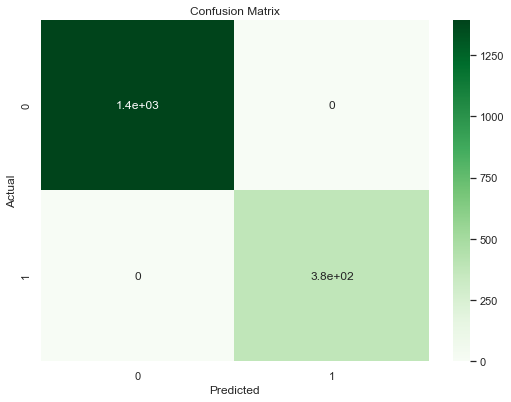

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1391
           1       1.00      1.00      1.00       382

   micro avg       1.00      1.00      1.00      1773
   macro avg       1.00      1.00      1.00      1773
weighted avg       1.00      1.00      1.00      1773



In [35]:
base_model = RandomForestClassifier(n_estimators = 7000, 
                                    max_features = 4,
                                    random_state = 42,
                                    oob_score = True)
base_model.fit(train_features, train_targets)

evaluate_model(base_model)


In [36]:
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start = 500, stop = 10000, num = 20)]
max_features = ['sqrt']+[i for i in range(1, len(features.columns)+1)]
# Maximum number of levels
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

random_grid

{'n_estimators': [500,
  1000,
  1500,
  2000,
  2500,
  3000,
  3500,
  4000,
  4500,
  5000,
  5500,
  6000,
  6500,
  7000,
  7500,
  8000,
  8500,
  9000,
  9500,
  10000],
 'max_features': ['sqrt', 1, 2, 3, 4, 5],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'min_samples_split': [2, 5, 10],
 'min_samples_leaf': [1, 2, 4],
 'bootstrap': [True, False]}

In [37]:
rfc = RandomForestClassifier(random_state = 42)

rfc_random = RandomizedSearchCV(estimator = rfc, param_distributions = random_grid, 
                               n_iter = 100, cv = 5, verbose=10, random_state=42, n_jobs = -1,
                               scoring = 'precision')

In [38]:
rfc_random.fit(train_features, train_targets)


Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed: 23.7min
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed: 47.3min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed: 76.5min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 83.6min finished


RandomizedSearchCV(cv=5, error_score='raise-deprecating',
          estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=42, verbose=0, warm_start=False),
          fit_params=None, iid='warn', n_iter=100, n_jobs=-1,
          param_distributions={'n_estimators': [500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500, 5000, 5500, 6000, 6500, 7000, 7500, 8000, 8500, 9000, 9500, 10000], 'max_features': ['sqrt', 1, 2, 3, 4, 5], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          r

In [39]:
rfc_random.best_params_


{'n_estimators': 8000,
 'min_samples_split': 2,
 'min_samples_leaf': 4,
 'max_features': 3,
 'max_depth': 30,
 'bootstrap': False}

Model Accuracy:
Precision on training data: 1.000
Precision on testing data: 1.000
Accuracy on test data: 0.999


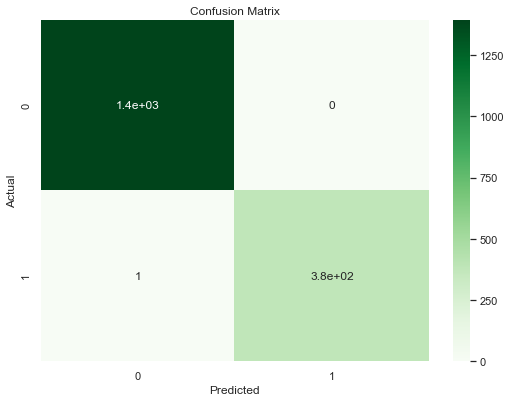

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1391
           1       1.00      1.00      1.00       382

   micro avg       1.00      1.00      1.00      1773
   macro avg       1.00      1.00      1.00      1773
weighted avg       1.00      1.00      1.00      1773



In [40]:
best_random = rfc_random.best_estimator_

evaluate_model(best_random)


### Prediction for the new stars

In [41]:
## chosing only GAIA stars close to 2.5 degree radius of the center

coordinate = coord.SkyCoord.from_name('M67')
print(coordinate)
radius = u.Quantity(2.5, u.deg)
Gaia.ROW_LIMIT = -1
# table = "gaiaedr3.gaia_source"
table = "gaiadr2.gaia_source"
j = Gaia.cone_search_async(coordinate, radius)
r_large = j.get_results()
print(type(r))

<SkyCoord (ICRS): (ra, dec) in deg
    (132.846, 11.814)>


INFO: Query finished. [astroquery.utils.tap.core]
<class 'astropy.table.table.Table'>


In [42]:
GAIA_target_stars = r_large.to_pandas()

GAIA_target_stars = GAIA_target_stars[GAIA_target_stars['parallax'] >= 0]

GAIA_target_stars = GAIA_target_stars[GAIA_target_stars.loc[:, 'bp_rp'].notnull()]

GAIA_target_stars.describe()

converted column 'priam_flags' from integer to float
converted column 'flame_flags' from integer to float


,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,...,e_bp_min_rp_percentile_lower,e_bp_min_rp_percentile_upper,flame_flags,radius_val,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist
count,7.098700e+04,7.098700e+04,7.098700e+04,70987.0,70987.000000,70987.000000,70987.000000,70987.000000,70987.000000,70987.000000,...,14780.000000,14780.000000,14337.0,14337.000000,14337.000000,14337.000000,14337.000000,14337.000000,14337.000000,70987.000000
mean,1.635721e+18,6.031195e+17,8.493591e+08,2015.5,132.757990,0.356870,11.776840,0.238726,1.040891,0.442350,...,0.099434,0.269887,200111.0,1.530959,1.411662,1.629827,4.420034,3.915124,4.924970,1.628621
std,0.000000e+00,3.772720e+15,4.885702e+08,0.0,1.253718,0.372633,1.233941,0.254779,0.896286,0.458192,...,0.136835,0.215108,0.0,2.990820,2.782772,3.180019,32.316772,28.910522,35.820766,0.620369
min,1.635721e+18,5.972678e+17,2.351200e+04,2015.5,130.293414,0.016709,9.317264,0.010515,0.000025,0.019948,...,0.000000,0.007100,200111.0,0.500071,0.335750,0.512218,0.029315,0.027656,0.030974,0.000629
25%,1.635721e+18,5.987866e+17,4.266851e+08,2015.5,131.757759,0.082238,10.783180,0.054873,0.460425,0.103831,...,0.008900,0.117000,200111.0,0.770195,0.699413,0.812905,0.322958,0.271497,0.370009,1.191328
50%,1.635721e+18,6.038886e+17,8.508727e+08,2015.5,132.735646,0.221730,11.772763,0.148129,0.818595,0.281179,...,0.048000,0.209800,200111.0,0.989648,0.907884,1.050576,0.781250,0.673000,0.884455,1.740937
75%,1.635721e+18,6.054554e+17,1.273630e+09,2015.5,133.734970,0.512807,12.754763,0.334747,1.346659,0.632646,...,0.130900,0.352000,200111.0,1.355431,1.240289,1.468601,2.017636,1.754474,2.262021,2.153055
max,1.635721e+18,6.092614e+17,1.692917e+09,2015.5,135.397369,3.119140,14.309803,2.653485,21.760508,4.168016,...,1.068500,1.447100,200111.0,90.470146,80.827682,98.599403,1537.619263,1312.932617,1762.305908,2.499963


In [52]:
# noise filter
GAIA_target_stars['g_mag_error'] = 2.5/np.log(10) / GAIA_target_stars.phot_g_mean_flux_over_error
mask = GAIA_target_stars.g_mag_error < 0.005

# distance filter
GAIA_target_stars['distance_pc'] = 1/(GAIA_target_stars.parallax*0.001)
dist_filter = abs(GAIA_target_stars.distance_pc - distance_literature) < best_width

# proper motion filter
pm_filter = (abs(GAIA_target_stars['pmra']) < 20) & (abs(GAIA_target_stars['pmdec']) < 20)

GAIA_target_stars = GAIA_target_stars.loc[mask & pm_filter & dist_filter, :]

In [53]:
GAIA_target_stars = GAIA_target_stars.dropna(subset = feature_columns)
len(GAIA_target_stars)

30069

In [55]:
# select the set of predictor variables from the new dataset
new_features = GAIA_target_stars.loc[:, imp_feature_columns]
new_features = new_features.astype('float32')

In [ ]:
# train the model again using all the features and targets of the previous dataset
# rfc.fit(features, targets)

In [56]:
base_model = RandomForestClassifier(n_estimators = 7000, 
                                    max_features = 4,
                                    oob_score = True)
base_model.fit(features, targets)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features=4, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=7000, n_jobs=None,
            oob_score=True, random_state=None, verbose=0, warm_start=False)

In [57]:
base_model.oob_score_

0.9984766418415707

In [58]:
# estimate the membership classification of the stars
GAIA_target_stars['member'] = base_model.predict(new_features)
# estimate the membership probability of the stars
GAIA_target_stars['PMemb'] = base_model.predict_proba(new_features)[:,1]
GAIA_target_stars['member'].value_counts()

0    28550
1     1519
Name: member, dtype: int64

In [61]:
print('n(PMemb >= 0.6) =', sum(GAIA_target_stars['PMemb'] >= 0.6))
print('n(PMemb >= 0.8) =', sum(GAIA_target_stars['PMemb'] >= 0.8))

n(PMemb >= 0.6) = 1506
n(PMemb >= 0.8) = 1452


In [62]:
rfc_random.best_estimator_

RandomForestClassifier(bootstrap=False, class_weight=None, criterion='gini',
            max_depth=30, max_features=3, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=4, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=8000, n_jobs=None,
            oob_score=False, random_state=42, verbose=0, warm_start=False)

In [63]:
best_random = rfc_random.best_estimator_
best_random.fit(train_features, train_targets)

# estimate the membership classification of the stars
GAIA_target_stars['member'] = best_random.predict(new_features)
# estimate the membership probability of the stars
GAIA_target_stars['PMemb'] = best_random.predict_proba(new_features)[:,1]

print('n(PMemb >= 0.6) =', sum(GAIA_target_stars['PMemb'] >= 0.6))
print('n(PMemb >= 0.8) =', sum(GAIA_target_stars['PMemb'] >= 0.8))
GAIA_target_stars['member'].value_counts()

n(PMemb >= 0.6) = 1482
n(PMemb >= 0.8) = 1423


0    28573
1     1496
Name: member, dtype: int64

In [64]:
potentialMember = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.6]
len(potentialMember)

1482

Model Accuracy:
Precision on training data: 1.000
Precision on testing data: 1.000
Accuracy on test data: 0.999


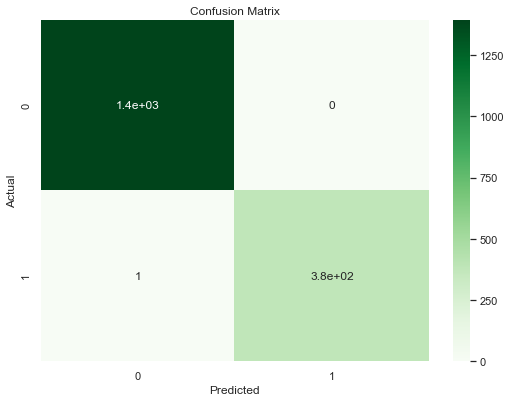

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1391
           1       1.00      1.00      1.00       382

   micro avg       1.00      1.00      1.00      1773
   macro avg       1.00      1.00      1.00      1773
weighted avg       1.00      1.00      1.00      1773



In [65]:
evaluate_model(best_random)

Number of members found by Gao with a RF model with n_estimators = 7000:
* n(PMemb >= 0.6) = 1502
* n(PMemb >= 0.8) = 1361

In [66]:
print('n(PMemb >= 0.6) =', sum(GAIA_target_stars['PMemb'] >= 0.6))
print('n(PMemb >= 0.8) =', sum(GAIA_target_stars['PMemb'] >= 0.8))

n(PMemb >= 0.6) = 1482
n(PMemb >= 0.8) = 1423


In [67]:
potentialMember.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,...,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist,g_mag_error,distance_pc,member,PMemb
count,1.482000e+03,1.482000e+03,1.482000e+03,1482.0,1482.000000,1482.000000,1482.000000,1482.000000,1482.000000,1482.000000,...,1006.000000,1006.000000,1006.000000,1006.000000,1006.000000,1482.000000,1482.000000,1482.000000,1482.0,1482.000000
mean,1.635721e+18,6.041160e+17,8.308373e+08,2015.5,132.852363,0.087845,11.812426,0.057472,1.129912,0.110954,...,1.421324,1.649942,4.269913,4.006845,4.532980,0.442467,0.000851,896.491049,1.0,0.982573
std,0.000000e+00,2.381253e+15,4.789645e+08,0.0,0.445433,0.096875,0.468952,0.063474,0.121504,0.122261,...,2.694729,3.059996,27.403734,25.825087,28.983397,0.462790,0.000894,109.279380,0.0,0.058327
min,1.635721e+18,5.975570e+17,1.427216e+06,2015.5,130.396966,0.018080,9.365995,0.011963,0.690116,0.021383,...,0.375463,0.586270,0.089308,0.071800,0.104245,0.000629,0.000149,683.503523,1.0,0.605413
25%,1.635721e+18,6.048917e+17,4.180585e+08,2015.5,132.689945,0.030060,11.664242,0.019916,1.082487,0.037784,...,0.745039,0.860670,0.334193,0.290071,0.368338,0.147146,0.000242,840.573981,1.0,0.998725
50%,1.635721e+18,6.049173e+17,8.289341e+08,2015.5,132.849210,0.046008,11.817415,0.029652,1.135665,0.057724,...,0.947363,1.073760,0.837000,0.766387,0.912948,0.290803,0.000493,880.541175,1.0,0.999969
75%,1.635721e+18,6.049633e+17,1.247141e+09,2015.5,133.014677,0.108719,11.985962,0.071207,1.189663,0.138396,...,1.289345,1.551319,2.373033,2.230561,2.514872,0.568380,0.001136,923.798573,1.0,1.000000
max,1.635721e+18,6.088616e+17,1.691157e+09,2015.5,135.277370,0.709851,14.297512,0.512493,1.463050,0.870812,...,48.507950,56.827263,586.685608,552.350098,621.021118,2.499166,0.004979,1449.032473,1.0,1.000000


In [68]:
member.describe()

,solution_id,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,...,radius_percentile_lower,radius_percentile_upper,lum_val,lum_percentile_lower,lum_percentile_upper,dist,g_mag_error,distance_pc,PMemb,gmm_label
count,1.274000e+03,1.274000e+03,1.274000e+03,1274.0,1274.000000,1274.000000,1274.000000,1274.000000,1274.000000,1274.000000,...,915.000000,915.000000,915.000000,915.000000,915.000000,1274.000000,1274.000000,1274.000000,1274.000000,1274.0
mean,1.635721e+18,6.042509e+17,8.386189e+08,2015.5,132.854043,0.078283,11.831970,0.051319,1.138112,0.098999,...,1.448222,1.682194,4.450797,4.179833,4.721762,0.311565,0.000768,885.590312,0.995090,0.0
std,0.000000e+00,2.098776e+15,4.798059e+08,0.0,0.275881,0.085400,0.274349,0.056307,0.099327,0.108760,...,2.791031,3.172387,28.612888,26.965759,30.260941,0.226740,0.000813,80.663827,0.008243,0.0
min,1.635721e+18,5.986167e+17,1.427216e+06,2015.5,131.915152,0.018080,10.889397,0.011963,0.793667,0.021383,...,0.389567,0.586270,0.089308,0.071800,0.104245,0.000629,0.000149,683.503523,0.950194,0.0
25%,1.635721e+18,6.048987e+17,4.294811e+08,2015.5,132.701583,0.029110,11.693321,0.019254,1.090165,0.036752,...,0.754194,0.870215,0.347265,0.313200,0.391721,0.132482,0.000232,841.958331,0.996241,0.0
50%,1.635721e+18,6.049177e+17,8.329529e+08,2015.5,132.850042,0.041059,11.820532,0.027169,1.137082,0.051623,...,0.953822,1.086977,0.872193,0.804225,0.933304,0.258588,0.000452,879.444000,0.998396,0.0
75%,1.635721e+18,6.049624e+17,1.256192e+09,2015.5,132.994839,0.093226,11.968782,0.060784,1.187707,0.119412,...,1.315215,1.576142,2.435024,2.296332,2.573717,0.441341,0.000980,917.292216,0.998875,0.0
max,1.635721e+18,6.081313e+17,1.691157e+09,2015.5,133.806044,0.597535,12.775522,0.438152,1.463050,0.844456,...,48.507950,56.827263,586.685608,552.350098,621.021118,0.996124,0.004979,1259.974681,0.999139,0.0


#### Figure 4
PMemb from RF as a function of G band Magnitude and distance from cluster center.

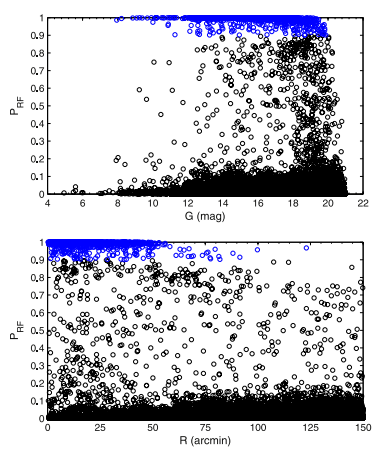

PMemb $\geq$ 0.9 are colored in blue.

In [125]:
sns.set(font_scale= 1.4)

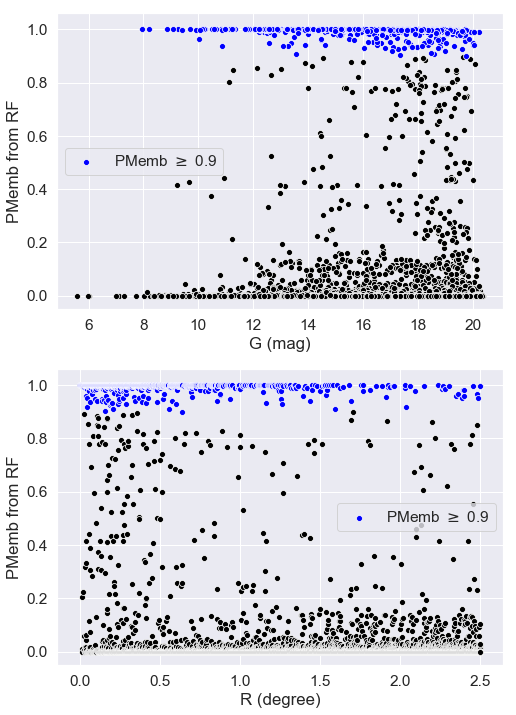

In [126]:
plt.figure(figsize = (8, 12))

PMemb_mask = GAIA_target_stars.PMemb >= 0.9
plt.subplot(211)
sns.scatterplot(x='phot_g_mean_mag', y = 'PMemb', data = GAIA_target_stars, 
                color = 'black')
sns.scatterplot(x='phot_g_mean_mag', y = 'PMemb', 
                data = GAIA_target_stars[PMemb_mask], 
                color = 'blue', label = 'PMemb $\geq$ 0.9')
plt.xlabel('G (mag)')
plt.ylabel('PMemb from RF')
#plt.title('Member')

plt.subplot(212)
sns.scatterplot(x='dist', y = 'PMemb', data = GAIA_target_stars, 
                color = 'black')
sns.scatterplot(x='dist', y = 'PMemb', 
                data = GAIA_target_stars[PMemb_mask], 
                color = 'blue', label = 'PMemb $\geq$ 0.9')
plt.xlabel('R (degree)')
plt.ylabel('PMemb from RF')
plt.legend()
plt.show()

#### Figure 7: CMD

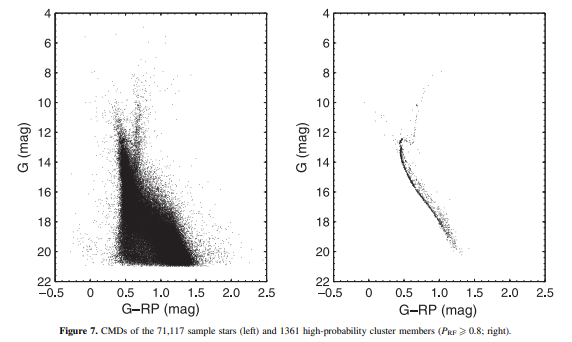

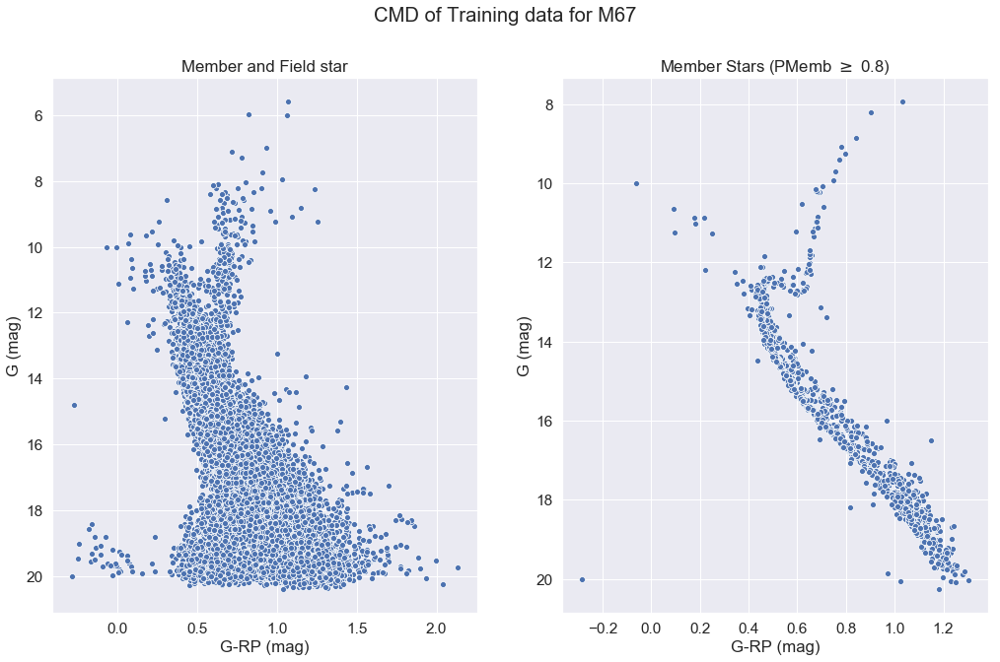

In [127]:
fig, axes = plt.subplots(1, 2, figsize=(17,10))
fig.suptitle('CMD of Training data for M67')

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag',
                data = GAIA_target_stars, ax = axes[0], marker = 'o')
axes[0].set_title('Member and Field star')
axes[0].set_xlabel('G-RP (mag)')
axes[0].set_ylabel('G (mag)')
axes[0].invert_yaxis()

PMemb_mask = GAIA_target_stars.PMemb >= 0.8

sns.scatterplot(x = 'g_rp', y='phot_g_mean_mag', marker = 'o',
                data = GAIA_target_stars[PMemb_mask], ax = axes[1])
axes[1].set_title('Member Stars (PMemb $\geq$ 0.8)')
axes[1].set_xlabel('G-RP (mag)')
axes[1].set_ylabel('G (mag)')
axes[1].invert_yaxis()

plt.show()


#### Figure 8
Comparison between GMM and RF membership probabilities

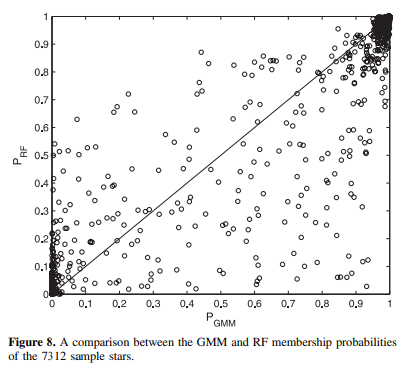

In [71]:
all_stars_feature = all_stars_filtered.loc[:, imp_feature_columns]
all_stars_filtered['PMemb_RF'] = best_random.predict_proba(all_stars_feature)[:,1]


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


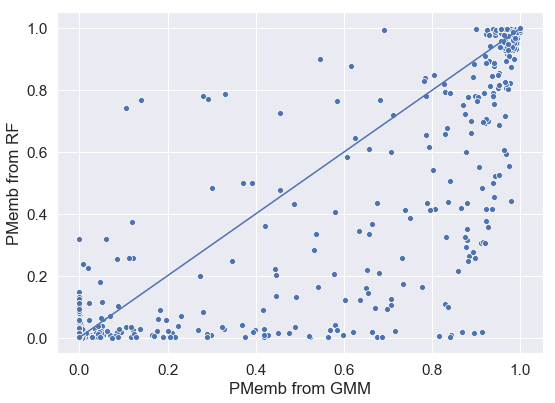

In [128]:
sns.scatterplot(x = 'PMemb', y = 'PMemb_RF', data = all_stars_filtered)
plt.ylabel('PMemb from RF')
plt.xlabel('PMemb from GMM')
plt.plot([0,1],[0,1])
plt.show()

#### Visualization

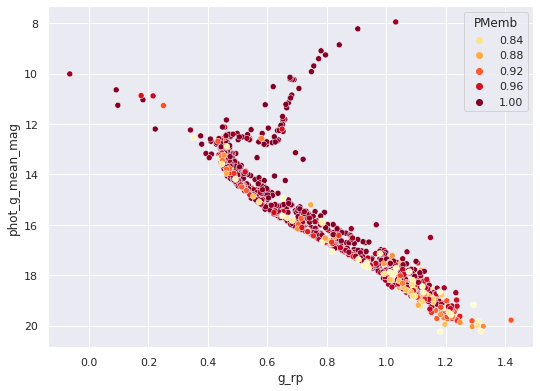

In [ ]:
# CMD of predicted members 

cmd = sns.scatterplot(x = 'g_rp', y = 'phot_g_mean_mag', hue= 'PMemb', 
                      palette='YlOrRd', data = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.8] )
cmd.invert_yaxis()

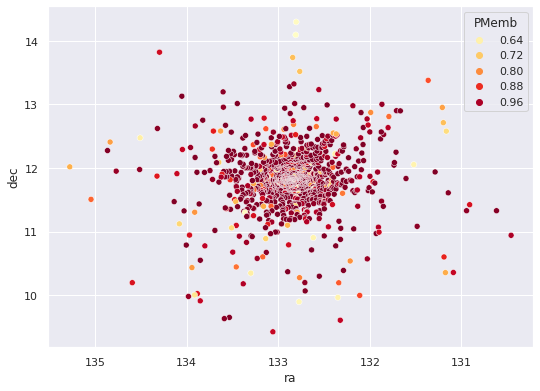

In [ ]:
skyplot = sns.scatterplot(x = 'ra', y = 'dec', hue= 'PMemb', 
                      palette='YlOrRd', data = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.6] )
skyplot.invert_xaxis()
plt.show()


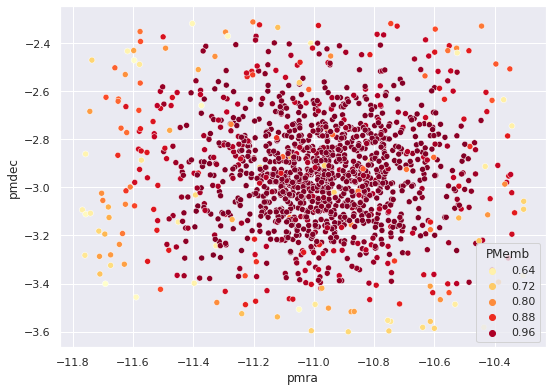

In [ ]:
# pm plot
sns.scatterplot(x = 'pmra', y = 'pmdec', hue= 'PMemb', 
                      palette='YlOrRd', data = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.6] )
plt.show()


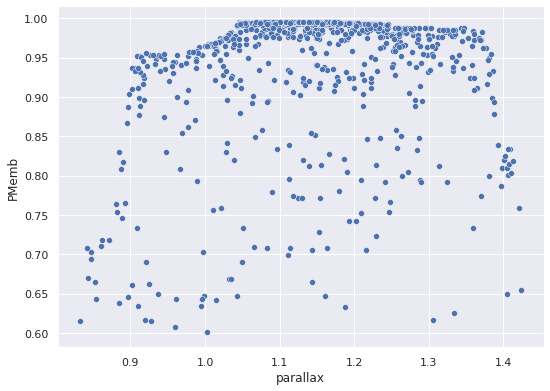

In [ ]:
# parallax plot
sns.scatterplot(x = 'parallax', y = 'PMemb',  
                      palette='YlOrRd', data = GAIA_target_stars[GAIA_target_stars['PMemb'] >= 0.6] )

In [ ]:
# saving the files as csv
# all_stars.to_csv('gaia_6405_membership_prob.csv')

potentialMember.to_csv('M_67_membership_prob.csv')


### Comparing the old and new predicted members

In [76]:
#### Finding Cantat catalogue

catalog_list = Vizier.find_catalogs('Cantat')
{k:v.description for k,v in catalog_list.items()}

{'I/349': 'StarHorse, Gaia DR2 photo-astrometric distances (Anders+, 2019)',
 'I/354': 'StarHorse2, Gaia EDR3 photo-astrometric distances (Anders+, 2022)',
 'J/A+A/561/A94': 'Velocities and photometry in Trumpler 20 (Donati+, 2014)',
 'J/A+A/564/A133': 'Gaia FGK benchmark stars: metallicity (Jofre+, 2014)',
 'J/A+A/569/A17': 'Gaia-ESO Survey: NGC6705 (Cantat-Gaudin+, 2014)',
 'J/A+A/582/A81': 'Gaia FGK benchmark stars: abundances (Jofre+, 2015)',
 'J/A+A/588/A120': 'Equivalent widths in 10 open clusters (Cantat-Gaudin+, 2016)',
 'J/A+A/591/A37': 'Gaia-ESO Survey. Parameters for cluster members (Jacobson+, 2016)',
 'J/A+A/597/A10': 'South Ecliptic Pole stars radial velocities (Fremat+, 2017)',
 'J/A+A/598/A68': 'Gaia-ESO Survey. Trumpler 23 (Overbeek+, 2017)',
 'J/A+A/601/A19': 'Gaia DR1 open cluster members (Gaia Collaboration+, 2017)',
 'J/A+A/603/A2': 'Gaia-ESO Survey abundances radial distribution (Magrini+, 2017)',
 'J/A+A/605/A79': 'TGAS Cepheids and RR Lyrae stars (Gaia Collabora

In [83]:
## saving only M67 data from Cantat
Vizier.ROW_LIMIT = -1

cantat_data = Vizier(catalog = 'J/A+A/633/A99/members', row_limit = -1).query_constraints(Cluster="NGC_2682")
cantat_data = cantat_data[0].to_pandas()
cantat_data.head()

,RA_ICRS,DE_ICRS,Source,Plx,pmRA,pmDE,RV,Gmag,BP-RP,Proba,Cluster,_RA.icrs,_DE.icrs
0,132.946529,11.353877,598696077168308992,1.2339,-10.911,-3.124,NaN,17.438299,2.0494,0.5,b'NGC_2682',132.946577,11.353890
1,132.801300,11.310755,598694939001774976,1.1585,-10.768,-2.795,NaN,13.923000,0.7829,0.5,b'NGC_2682',132.801347,11.310767
2,132.951477,11.302159,598692675554477056,1.1421,-11.195,-2.794,NaN,14.430800,0.8615,0.7,b'NGC_2682',132.951526,11.302171
3,132.890835,11.380829,598697142320464384,1.1938,-11.146,-2.894,NaN,12.622900,0.7340,0.7,b'NGC_2682',132.890884,11.380841
4,132.794558,11.317111,598695007721506432,1.1271,-10.988,-2.999,NaN,17.277000,1.7379,0.4,b'NGC_2682',132.794606,11.317124


In [84]:
# renaming the cantat table to match it with gaia_data
cantat_data = cantat_data.rename(columns={'Source':'source_id',
                                          'Proba':'PMemb_cantat'})

# taking the subset of only source_id and PMemb
cantat_data = cantat_data.loc[:,['source_id', 'PMemb_cantat']]

# join the two table on source_id
cantat_data = GAIA_target_stars.join(cantat_data.set_index('source_id'), on='source_id')

# dropping the rows, where we don't have PMemb_cantat 
# (i.e. the source id was not in the cantat table)
cantat_data = cantat_data.dropna(subset=['PMemb_cantat'])
cantat_data.head()

,solution_id,designation,source_id,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,...,lum_val,lum_percentile_lower,lum_percentile_upper,datalink_url,dist,g_mag_error,distance_pc,member,PMemb,PMemb_cantat
0,1635721458409799680,b'Gaia DR2 604917629355038848',604917629355038848,309606362,2015.5,132.845427,0.033842,11.813721,0.022365,1.129222,...,5.409647,5.116649,5.702646,b'https://gea.esac.esa.int/data-server/datalin...,0.000629,0.000205,885.565629,1,1.0,0.8
2,1635721458409799680,b'Gaia DR2 604917732434252032',604917732434252032,1037136882,2015.5,132.847883,0.047155,11.818284,0.028357,1.113444,...,0.286409,0.253650,0.319167,b'https://gea.esac.esa.int/data-server/datalin...,0.004667,0.000698,898.114453,1,1.0,0.9
3,1635721458409799680,b'Gaia DR2 604917732434325248',604917732434325248,1685360922,2015.5,132.845628,0.023422,11.820310,0.014362,1.125087,...,3.119858,2.927116,3.312600,b'https://gea.esac.esa.int/data-server/datalin...,0.006326,0.000288,888.820446,1,1.0,0.7
4,1635721458409799680,b'Gaia DR2 604917629355039360',604917629355039360,340729517,2015.5,132.846939,0.039546,11.807362,0.023041,1.111626,...,1.604247,1.452243,1.756252,b'https://gea.esac.esa.int/data-server/datalin...,0.006695,0.000869,899.583451,1,1.0,1.0
5,1635721458409799680,b'Gaia DR2 604917698074587136',604917698074587136,1308383390,2015.5,132.840032,0.034797,11.817361,0.020084,1.189351,...,0.544629,0.501133,0.588124,b'https://gea.esac.esa.int/data-server/datalin...,0.006747,0.000606,840.794499,1,1.0,0.7


In [85]:
# creating subset for the member and Cantat Member

concatenated = pd.concat([potentialMember.assign(dataset='member_by_RF'), cantat_data.assign(dataset='cantat')])
concatenated.reset_index(drop=True)
concatenated.dataset.value_counts()

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



member_by_RF    1482
cantat           845
Name: dataset, dtype: int64

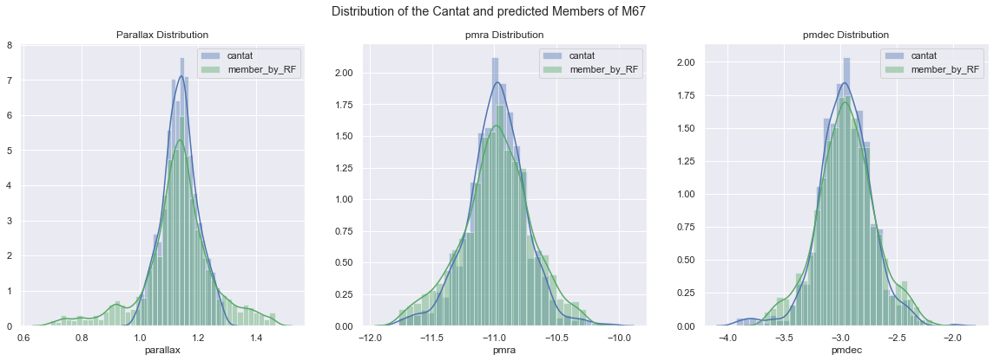

In [91]:
fig, axes = plt.subplots(1, 3, figsize=(20,6))
fig.suptitle('Distribution of the Cantat and predicted Members of M67')


sns.distplot(cantat_data['parallax'], color = 'b', label = 'cantat', 
             kde=True, ax=axes[0])
sns.distplot(potentialMember['parallax'], color = 'g', label = 'member_by_RF', 
             kde=True, ax=axes[0])
axes[0].set_title('Parallax Distribution')
axes[0].legend()

sns.distplot(cantat_data['pmra'], color = 'b', label = 'cantat', 
             kde=True, ax=axes[1])
sns.distplot(potentialMember['pmra'], color = 'g', label = 'member_by_RF', 
             kde=True, ax=axes[1])
axes[1].set_title('pmra Distribution')
axes[1].legend()

sns.distplot(cantat_data['pmdec'], color = 'b', label = 'cantat', 
             kde=True, ax=axes[2])
sns.distplot(potentialMember['pmdec'], color = 'g', label = 'member_by_RF', 
             kde=True, ax=axes[2])
axes[2].set_title('pmdec Distribution')
axes[2].legend()

plt.show()


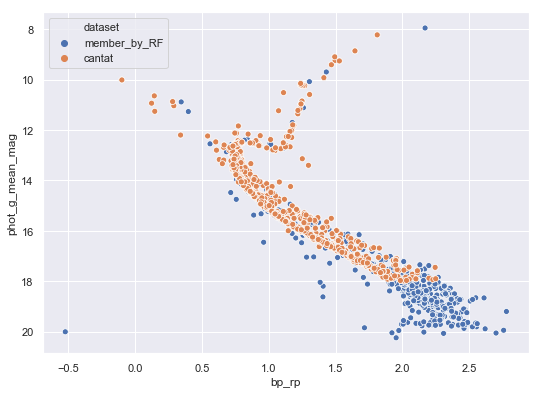

In [88]:
cmd = sns.scatterplot(x='bp_rp', y='phot_g_mean_mag', data=concatenated,
                hue='dataset')
cmd.invert_yaxis()

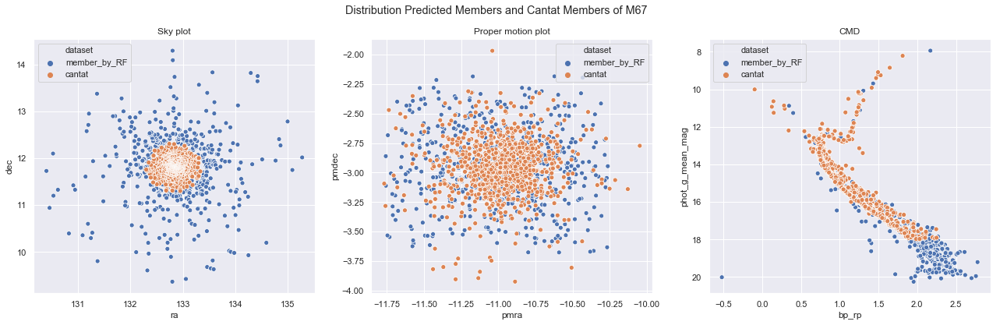

In [92]:
fig, axes = plt.subplots(1, 3, figsize=(22,6))
fig.suptitle('Distribution Predicted Members and Cantat Members of M67')

skyplot = sns.scatterplot(x='ra', y='dec', data=concatenated,
                hue='dataset', ax=axes[0])
axes[0].set_title('Sky plot')

# proper motion plot
sns.scatterplot(x='pmra', y='pmdec', data=concatenated,
                hue='dataset', ax=axes[1])
axes[1].set_title('Proper motion plot')

cmd = sns.scatterplot(x='bp_rp', y='phot_g_mean_mag', data=concatenated,
                hue='dataset', ax=axes[2])
cmd.invert_yaxis()
axes[2].set_title('CMD')

plt.show()

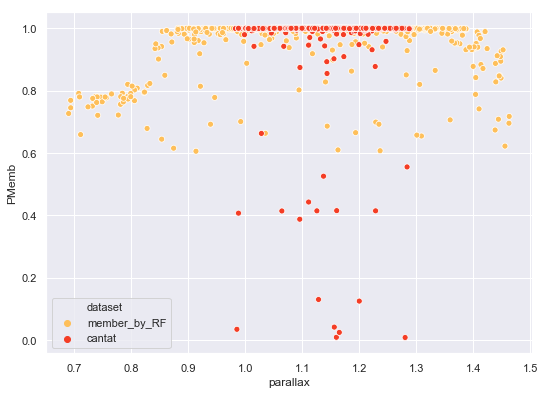

In [90]:
# parallax vs PMemb plot
sns.scatterplot(x = 'parallax', y = 'PMemb',  hue = 'dataset',
                      palette='YlOrRd', data = concatenated )

In [ ]:
# pd_prof.ProfileReport(potentialMember)

In [ ]:
#files.download('M_67_cantat.csv')

#files.download('M_67_membership_prob.csv')

ValueError: could not convert string to float: b'Gaia DR2 604917629355038848'

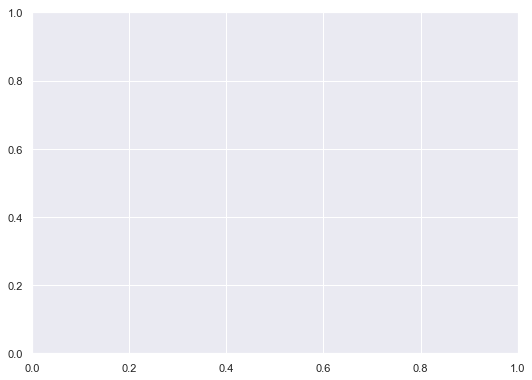

In [117]:
sns.kdeplot(x='ra', y='dec', data = GAIA_target_stars)

Passing a 2D dataset for a bivariate plot is deprecated in favor of kdeplot(x, y), and it will cause an error in future versions. Please update your code.


TypeError: _bivariate_kdeplot() got multiple values for argument 'x'

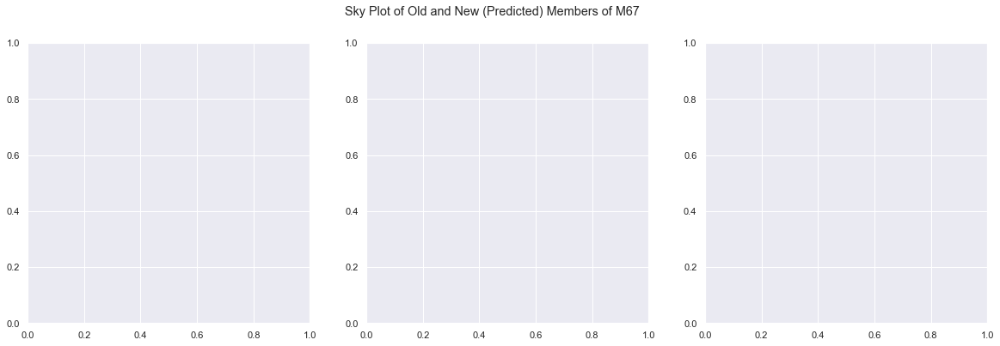

In [115]:
fig, axes = plt.subplots(1, 3, figsize=(20,6))
fig.suptitle('Sky Plot of Old and New (Predicted) Members of M67')

sns.kdeplot(x='ra', y='dec', data = cantat_data[feature_columns], shade=True, color = 'orange', 
            bw_method = 0.20, cbar=True, ax=axes[0])
axes[0].set_title('Old_member')

#sns.kdeplot(x='ra', y='dec', data = potentialMember, shade=True, color = 'blue', 
#            bw_method = 0.20, cbar=True, ax=axes[1])
#axes[1].set_title('New_member')

#sns.kdeplot(x='ra', y='dec', data = concatenated.reset_index(drop=True), shade=True, color = 'g', 
#            bw_method = 0.20, cbar=True, ax=axes[2])
#axes[2].set_title('Old_member + New_member')

plt.show()

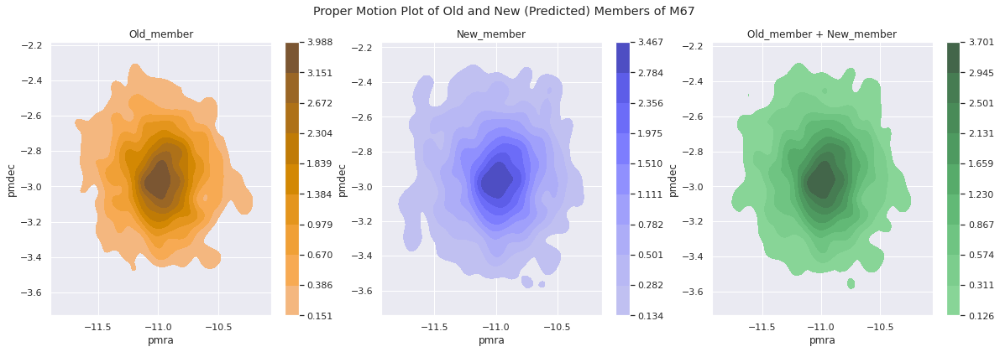

In [ ]:

fig, axes = plt.subplots(1, 3, figsize=(20,6))
fig.suptitle('Proper Motion Plot of Old and New (Predicted) Members of M67')

sns.kdeplot(x='pmra', y='pmdec', data = member, shade=True, color = 'orange', 
            bw_method = 0.20, cbar=True, ax=axes[0])
axes[0].set_title('Old_member')

sns.kdeplot(x='pmra', y='pmdec', data = potentialMember, shade=True, color = 'blue', 
            bw_method = 0.20, cbar=True, ax=axes[1])
axes[1].set_title('New_member')

sns.kdeplot(x='pmra', y='pmdec', data = concatenated.reset_index(drop=True), shade=True, color = 'g', 
            bw_method = 0.20, cbar=True, ax=axes[2])
axes[2].set_title('Old_member + New_member')

plt.show()

In [ ]:
from google.colab import files

In [ ]:
#files.download('M_67_cantat.csv')

potentialMember.to_csv('M_67_additional_member_prob.csv')
concatenated.to_csv('M_67_all_member_prob.csv')

#files.download('M_67_all_member_prob.csv')
# column 'dataset': Old_member, New_member
# column 'member': 0 and 1
# column 'PMemb': decimal values between 0 to 1

#files.download('M_67_additional_member_prob.csv')
